<h1> Black Box Optimizer v3.1: </h1>
+ Log Scale Random Number Through Manual Input<br>           
+ Multiple Stocks<br>
+ Multiple Alternatives<br>
+ Echo Machine File Output<br>
+ Table2Speech File Output<br>
+ Visualising Results as BoxPlot<br>
+ Visualising Results for each Metabolite<br>
+ Visualising Concentrations for each Day<br>
+ Find K Most Informative combinations<br>
+ Find Metabolite's Importance<br>
+ Find NonLinear Interactions<br>




In [ ]:
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
import time
from sklearn.model_selection import RandomizedSearchCV
from itertools import product
import seaborn as sns
import matplotlib.pyplot as plt
from collections.abc import Iterable
import math
import random
from scipy.stats import spearmanr, pearsonr

pd.options.mode.chained_assignment = None  # default='warn'
!wget https://raw.githubusercontent.com/myprogrammerpersonality/BlackBoxOptimizer/master/Functions_Final_v3_1.py

from Functions_Final_v3_1 import *

--2021-09-07 07:05:45--  https://raw.githubusercontent.com/myprogrammerpersonality/BlackBoxOptimizer/master/Functions_Final_v3_1.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22100 (22K) [text/plain]
Saving to: ‘Functions_Final_v3_1.py’

Functions_Final_v3_ 100%[===================>]  21.58K  --.-KB/s    in 0s      

2021-09-07 07:05:45 (96.8 MB/s) - ‘Functions_Final_v3_1.py’ saved [22100/22100]



This notebook includes all data processing, bayesian optimization and results visualisation

# User Inputs

<p1><h2> When to use this part:</h2>
* every time before using BBO you should fill this part based on your project</p1>
<p1><h2> How to use this part:</h2>
* User should upload all available Results file (i.e. Results_1.csv to Results_n.csv) to runtime from Files/UploadFile
* now there is an example, change it to your project</p1>

In [ ]:
# General Parameters:
m = 125      # number_of_combination_each_round
minimum_drop_size_nanoliter = 25
final_reaction_volume_nanoliter = 10000
maximum_volume_of_model_output = 9000 # (e.g. volume except fixed parts - 100 nl avoid 0 water)
fixed_parts = {'Substrate':0.1} 
days_total = 9 # how many days you want to continue # set it at your max prediction

# Model Parameters:
RandomCV = True
n_iter = 200
ensemble_len = 20 
exploration = {1: 1.41, 2: 1.41, 3: 1,
               4: 1.0, 5: 0.5, 6: 1.0, 7:0.5, 8:0.5, 9:0.5}
days_range = [m for i in range(days_total)]

In [ ]:
# Part 1: choose grid for our metabolite conc and define stock concentration

# it is important to define all value for function to be able to get conc that is appropriate to your minimum drop size
# each metabolite min, max and stock must be in same units

# concentrations_limits :
# *** metabolite name must not includes "_" ***

concentrations_limits = {
  'HEPES':{'Conc_Min':50.0, 'Conc_Max':200.0, 'Conc_Values':[50.0, 75.0, 100.0, 125.0, 150.0, 175.0, 200.0], 'Conc_Stock':1000.0, 'Alternatives':['pH7.0','pH7.2','pH7.4','pH7.6','pH7.8','pH8.0']},
  'MgCl2':{'Conc_Min':0.0, 'Conc_Max':20.0, 'Conc_Values':[0.0, 2.5, 5.0, 7.5, 10.0, 12.5, 15.0, 17.5, 20.0], 'Conc_Stock':1000.0, 'Alternatives':None},
  'CP':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.0, 2.5, 5.0, 10.0, 20.0, 40.0, 60.0], 'Conc_Stock':500.0, 'Alternatives':None},
  'Bicarbonate':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[2.5, 5.0, 10.0, 20.0, 40.0, 60.0, 80.0], 'Conc_Stock':1000.0, 'Alternatives':None},
  'Formate':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.0, 2.5, 5.0, 10.0, 20.0, 40.0, 60.0, 80.0], 'Conc_Stock':1000.0, 'Alternatives':None},
  'CoA':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 1.0, 2.0, 3.0, 4.0, 5.0], 'Conc_Stock':40.0, 'Alternatives':None},
  'B12':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.0, 0.1, 0.2, 0.4], 'Conc_Stock':5.0, 'Alternatives':None},
  'ATP':{'Conc_Min':0.5, 'Conc_Max':10.0, 'Conc_Values':None, 'Conc_Stock':400.0, 'Alternatives':None},
  'NADPH':{'Conc_Min':1.0, 'Conc_Max':10.0, 'Conc_Values':None, 'Conc_Stock':500.0, 'Alternatives':None},
  'Pco':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.09567500000000001, 0.287025, 0.4783750000000001, 0.9567500000000002, 1.72215 , 2.2962, 3.0616000000000003,  4.01835,  5.357800000000001, 7.175625000000001,  9.5675], 'Conc_Stock':38.27, 'Alternatives':None},
  'Ccr':{'Conc_Min':0.31, 'Conc_Max':3.08, 'Conc_Values':None, 'Conc_Stock':123.34, 'Alternatives':None},
  'Epi':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.7445, 1.489, 2.2335000000000003, 2.978, 3.7225, 4.4670000000000005, 5.2115, 5.956, 6.7005], 'Conc_Stock':297.80, 'Alternatives':None},
  'Mcm':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.152075, 0.30415, 0.456225, 0.6083, 0.91245, 1.2166, 1.5207499999999998, 2.12905, 2.889425], 'Conc_Stock':60.83, 'Alternatives':None},
  'Scr':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.871825, 1.74365, 2.615475, 3.4873, 5.23095, 6.9746, 9.590075, 13.077375000000002,  17.4365], 'Conc_Stock':348.73, 'Alternatives':None},
  'Ssr':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.552, 1.104, 1.6560000000000004, 2.208, 2.76, 3.3120000000000007, 3.864, 4.416, 4.968], 'Conc_Stock':220.80, 'Alternatives':None},
  'Hbs':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.533925, 1.601775, 2.6696249999999995, 5.339249999999999, 9.076725, 12.280274999999998, 16.551675, 21.890924999999996, 29.365875, 39.51045, 52.858575], 'Conc_Stock':213.57, 'Alternatives':None},
  'Hbd':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.3636, 0.7272, 1.0908, 1.4544, 1.818, 2.1816, 2.5452, 2.9088, 3.2724, 3.636], 'Conc_Stock':145.44, 'Alternatives':None},
  'Ecm':{'Conc_Min':0.29, 'Conc_Max':2.88, 'Conc_Values':None, 'Conc_Stock':115.30, 'Alternatives':None},
  'Mco':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[26.008149999999997, 34.22125,  46.5409, 62.96709999999999 , 84.86869999999999, 113.61455], 'Conc_Stock':547.54, 'Alternatives':None},
  'Mch':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.2836, 0.5672, 0.8508, 1.1344, 1.4180000000000001, 1.7016, 1.9852, 2.2688, 2.5524, 2.8360000000000003], 'Conc_Stock':113.44, 'Alternatives':None},
  'Mcl':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.39799999999999996, 0.7959999999999999, 1.194, 1.5919999999999999, 1.99, 2.7859999999999996, 3.582, 4.776, 6.367999999999999, 8.358, 11.143999999999998, 14.726, 19.9], 'Conc_Stock':159.20, 'Alternatives':None},
  'KatE':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[ 0.82065, 1.6413, 2.46195, 3.2826, 4.10325, 4.9239, 5.744549999999999, 6.5652, 7.38585, 8.2065], 'Conc_Stock':328.26, 'Alternatives':None},
  'Fdh':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[4.367999999999999, 7.28, 13.104, 23.296, 30.576, 40.768, 53.872, 72.8], 'Conc_Stock':582.40, 'Alternatives':None},
  'CA':{'Conc_Min':0.02, 'Conc_Max':0.17, 'Conc_Values':None, 'Conc_Stock':6.67, 'Alternatives':None},
  'Gor':{'Conc_Min':0.28, 'Conc_Max':5.52, 'Conc_Values':[0.276175, 0.828525, 1.380875, 1.933225, 2.485575, 2.76175, 3.037925, 3.3141, 3.590275, 3.86645, 4.142625, 4.4188, 4.694975, 4.97115, 5.247324999999999], 'Conc_Stock':110.47, 'Alternatives':None},
  'CK':{'Conc_Min':None, 'Conc_Max':None, 'Conc_Values':[0.39215000000000005, 0.7843000000000001, 1.1764500000000002, 1.5686000000000002, 1.96075, 2.3529000000000004, 2.74505, 3.1372000000000004, 3.529350000000001], 'Conc_Stock':156.86, 'Alternatives':None}}

In [ ]:
# Check Possible Concentrations
data_lists = {}
num = 0 

pool_size = 1

for key, value in concentrations_limits.items():
    print('Possible Conc For :',key)
    if not value['Conc_Values']:
        print('Your Min, Max :', "({}, {})".format(value['Conc_Min'], value['Conc_Max']))
    concs, vols = allowed_output(value, reaction_vol_nl = final_reaction_volume_nanoliter, drop_size_nl = minimum_drop_size_nanoliter, verbose=0)
    print(concs)
    print(vols)
    
    pool_size *= len(concs)

    data_lists[num] = vols
    num += 1
    print()

print('All Possible Combination Number = ', pool_size)
if pool_size > 10000000: 
    pool_size = 10000000
    print('Percentage calculation is not availbe duo to large pool size!')
else:
    percent , pool_size = percentage_possible(data_lists, threshold = maximum_volume_of_model_output)
    print(percent, f'% of {pool_size} possible combination are executable!')

Possible Conc For : HEPES
[50.0, 75.0, 100.0, 125.0, 150.0, 175.0, 200.0]
[500.0, 750.0, 1000.0, 1250.0, 1500.0, 1750.0, 2000.0]

Possible Conc For : MgCl2
[0.0, 2.5, 5.0, 7.5, 10.0, 12.5, 15.0, 17.5, 20.0]
[0.0, 25.0, 50.0, 75.0, 100.0, 125.0, 150.0, 175.0, 200.0]

Possible Conc For : CP
[0.0, 2.5, 5.0, 10.0, 20.0, 40.0, 60.0]
[0.0, 50.0, 100.0, 200.0, 400.0, 800.0, 1200.0]

Possible Conc For : Bicarbonate
[2.5, 5.0, 10.0, 20.0, 40.0, 60.0, 80.0]
[25.0, 50.0, 100.0, 200.0, 400.0, 600.0, 800.0]

Possible Conc For : Formate
[0.0, 2.5, 5.0, 10.0, 20.0, 40.0, 60.0, 80.0]
[0.0, 25.0, 50.0, 100.0, 200.0, 400.0, 600.0, 800.0]

Possible Conc For : CoA
[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 1.0, 2.0, 3.0, 4.0, 5.0]
[0.0, 25.0, 50.0, 75.0, 100.0, 125.0, 250.0, 500.0, 750.0, 1000.0, 1250.0]

Possible Conc For : B12
[0.0, 0.1, 0.2, 0.4]
[0.0, 200.0, 400.0, 800.0]

Possible Conc For : ATP
Your Min, Max : (0.5, 10.0)
[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0]
[0, 25, 50, 75, 100, 125, 150, 17

In [ ]:
# add reference and negative control
# leave it empty if you dont need
# you can add more desired combination to this dictionary
# *** conc in these dic must be compatible with minimum drop size ***

specials = {
"control_neg": {'HEPES':[100.0], 'HEPES_pH7.0':[0], 'HEPES_pH7.2':[0], 'HEPES_pH7.4':[0], 'HEPES_pH7.6':[1], 'HEPES_pH7.8':[0], 'HEPES_pH8.0':[0], 'MgCl2':[5.0], 'CP':[20.0], 'Bicarbonate':[50.0], 'Formate':[20.0], 'Hbs':[5.33925], 'Hbd':[0.7272], 'Ecm':[0.5765],'Mco':[21.9016], 'Mch':[0.2836], 'Mcl':[2.786],
       'CoA':[0.5], 'B12':[0.1], 'NADPH':[5.0], 'ATP':[2.0], 'Pco':[3.0616], 'Ccr':[0.6167], 'Epi':[0.7445], 'Mcm':[0.30415], 'Scr':[2.615475], 'Ssr':[0.552], 'KatE':[1.6413], 'Fdh':[14.56],
           'CA':[0.016675], 'Gor':[1.1047], 'CK':[0.39215]},
"control_pos": {'HEPES':[100.0], 'HEPES_pH7.0':[0], 'HEPES_pH7.2':[0], 'HEPES_pH7.4':[0], 'HEPES_pH7.6':[1], 'HEPES_pH7.8':[0], 'HEPES_pH8.0':[0], 'MgCl2':[5.0], 'CP':[20.0], 'Bicarbonate':[50.0], 'Formate':[20.0], 'Hbs':[5.33925], 'Hbd':[0.7272], 'Ecm':[0.5765],'Mco':[21.9016], 'Mch':[0.2836], 'Mcl':[2.786],
       'CoA':[0.5], 'B12':[0.1], 'NADPH':[5.0], 'ATP':[2.0], 'Pco':[3.0616], 'Ccr':[0.6167], 'Epi':[0.7445], 'Mcm':[0.30415], 'Scr':[2.615475], 'Ssr':[0.552], 'KatE':[1.6413], 'Fdh':[14.56],
           'CA':[0.016675], 'Gor':[1.1047], 'CK':[0.39215]}

}

# Day 1 (in absence of Day_0)

<p1><h2> When to use this part:</h2>
* after filling "User Input" if you have no pre existing data (Day_0.csv) 
<p1><h2> How to use this part:</h2>
* just run all cells!


In [ ]:
# make random combinations
Concentrations_1 = random_combination_generator(concentrations_limits, number_of_combination = m,
                                                reaction_vol_nl=final_reaction_volume_nanoliter,
                                                max_nl=maximum_volume_of_model_output, drop_size_nl=minimum_drop_size_nanoliter, return_df=True)

# add control, reference and other desired combinations
df_specials = [pd.DataFrame(i) for i in specials.values()]
Concentrations_1 = pd.concat([Concentrations_1, *df_specials]).reset_index(drop=True)

Concentrations_1

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,200.0,0.0,0.0,1.0,0.0,0.0,0.0,2.5,60.0,5.0,0.0,2.0,0.0,5.0,3.75,5.357800,1.23340,3.7225,0.456225,1.743650,3.864,0.533925,1.4544,1.15300,62.96710,2.2688,0.398,4.92390,23.296,0.133400,3.866450,1.17645
1,125.0,0.0,0.0,0.0,0.0,1.0,0.0,7.5,5.0,5.0,40.0,2.0,0.0,2.0,6.25,5.357800,1.54175,2.9780,0.608300,6.974600,3.312,12.280275,3.6360,0.57650,46.54090,0.2836,1.194,3.28260,40.768,0.033350,1.933225,3.13720
2,175.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,20.0,10.0,0.1,0.4,8.0,1.25,2.296200,0.30835,5.2115,0.152075,3.487300,3.864,5.339250,3.2724,0.86475,62.96710,2.8360,1.592,2.46195,30.576,0.116725,3.866450,1.17645
3,175.0,0.0,0.0,0.0,0.0,1.0,0.0,15.0,2.5,80.0,60.0,0.1,0.0,4.0,8.75,2.296200,0.92505,6.7005,0.152075,9.590075,2.760,2.669625,2.5452,0.86475,113.61455,1.7016,1.990,8.20650,7.280,0.133400,3.314100,2.74505
4,175.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,10.0,20.0,10.0,5.0,0.0,3.0,6.25,0.287025,1.23340,5.9560,0.608300,13.077375,2.760,5.339250,3.6360,2.01775,34.22125,0.5672,0.398,4.10325,53.872,0.150075,5.247325,3.52935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,50.0,0.0,1.0,0.0,0.0,0.0,0.0,12.5,2.5,60.0,60.0,0.1,0.0,1.0,8.75,3.061600,0.61670,5.2115,2.129050,5.230950,4.968,29.365875,1.8180,1.72950,46.54090,0.2836,19.900,8.20650,7.280,0.050025,2.761750,3.13720
123,175.0,0.0,0.0,1.0,0.0,0.0,0.0,2.5,5.0,80.0,5.0,0.4,0.2,6.0,7.50,2.296200,3.08350,0.7445,0.912450,1.743650,1.104,39.510450,1.0908,0.28825,46.54090,2.2688,3.582,0.82065,30.576,0.066700,3.037925,1.17645
124,125.0,0.0,0.0,0.0,0.0,0.0,1.0,20.0,5.0,20.0,5.0,1.0,0.1,4.0,6.25,0.095675,1.85010,1.4890,0.912450,13.077375,4.416,52.858575,2.5452,0.86475,46.54090,1.9852,1.592,4.10325,40.768,0.016675,4.694975,1.17645
125,100.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,20.0,50.0,20.0,0.5,0.1,2.0,5.00,3.061600,0.61670,0.7445,0.304150,2.615475,0.552,5.339250,0.7272,0.57650,21.90160,0.2836,2.786,1.64130,14.560,0.016675,1.104700,0.39215


In [ ]:
!mkdir -p Day_1
Concentrations_1.to_csv('Day_1/Concentrations_1.csv', index=False)

In [ ]:
# concentration_to_volume
Volumes_1 = concentration_to_volume(Concentrations_1, concentrations_limits, reaction_mixture_vol_nl=final_reaction_volume_nanoliter,
                                    fixed_parts=fixed_parts)
Volumes_1.to_csv('Day_1/Volumes_1.csv', index=False)
Volumes_1

,HEPES,HEPES_Type,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,Substrate,water
0,2000.0,pH7.4,25.0,1200.0,50.0,0.0,500.0,0.0,125.0,75.0,1400.0,100.0,125.0,75.0,50.0,175.0,25.0,100.0,100.0,1150.0,200.0,25.0,150.0,400.0,200.0,350.0,75.0,1000.0,325.0
1,1250.0,pH7.8,75.0,100.0,50.0,400.0,500.0,0.0,50.0,125.0,1400.0,125.0,100.0,100.0,200.0,150.0,575.0,250.0,50.0,850.0,25.0,75.0,100.0,700.0,50.0,175.0,200.0,1000.0,1325.0
2,1750.0,pH8.0,0.0,100.0,200.0,100.0,25.0,800.0,200.0,25.0,600.0,25.0,175.0,25.0,100.0,175.0,250.0,225.0,75.0,1150.0,250.0,100.0,75.0,525.0,175.0,350.0,75.0,1000.0,1450.0
3,1750.0,pH7.8,150.0,50.0,800.0,600.0,25.0,0.0,100.0,175.0,600.0,75.0,225.0,25.0,275.0,125.0,125.0,175.0,75.0,2075.0,150.0,125.0,250.0,125.0,200.0,300.0,175.0,1000.0,250.0
4,1750.0,pH8.0,50.0,200.0,200.0,100.0,1250.0,0.0,75.0,125.0,75.0,100.0,200.0,100.0,375.0,125.0,250.0,250.0,175.0,625.0,50.0,25.0,125.0,925.0,225.0,475.0,225.0,1000.0,925.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,500.0,pH7.2,125.0,50.0,600.0,600.0,25.0,0.0,25.0,175.0,800.0,50.0,175.0,350.0,150.0,225.0,1375.0,125.0,150.0,850.0,25.0,1250.0,250.0,125.0,75.0,250.0,200.0,1000.0,475.0
123,1750.0,pH7.4,25.0,100.0,800.0,50.0,100.0,400.0,150.0,150.0,600.0,250.0,25.0,150.0,50.0,50.0,1850.0,75.0,25.0,850.0,200.0,225.0,25.0,525.0,100.0,275.0,75.0,1000.0,125.0
124,1250.0,pH8.0,200.0,100.0,200.0,50.0,250.0,200.0,100.0,125.0,25.0,150.0,50.0,150.0,375.0,200.0,2475.0,175.0,75.0,850.0,175.0,100.0,125.0,700.0,25.0,425.0,75.0,1000.0,375.0
125,1000.0,pH7.6,50.0,400.0,500.0,200.0,125.0,200.0,50.0,100.0,800.0,50.0,25.0,50.0,75.0,25.0,250.0,50.0,50.0,400.0,25.0,175.0,50.0,250.0,25.0,100.0,25.0,1000.0,3950.0


In [ ]:
yield_topTenPercent=yield_all.loc[yield_all['yield'] >= yield_all['yield'].quantile(q=0.9)]

In [ ]:
yield_topTenPercent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63 entries, 138 to 607
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        63 non-null     int64  
 1   HEPES_pH8.0  63 non-null     int64  
 2   HEPES_pH7.4  63 non-null     int64  
 3   HEPES_pH7.6  63 non-null     int64  
 4   HEPES_pH7.8  63 non-null     int64  
 5   HEPES_pH7.2  63 non-null     int64  
 6   HEPES_pH7.0  63 non-null     int64  
 7   MgCl2        63 non-null     float64
 8   CP           63 non-null     float64
 9   Bicarbonate  63 non-null     float64
 10  Formate      63 non-null     float64
 11  CoA          63 non-null     float64
 12  B12          63 non-null     float64
 13  ATP          63 non-null     int64  
 14  NADPH        63 non-null     float64
 15  Pco          63 non-null     float64
 16  Ccr          63 non-null     float64
 17  Epi          63 non-null     float64
 18  Mcm          63 non-null     float64
 19  Scr    

In [ ]:
yield_topTenPercent=yield_topTenPercent.drop('yield', axis=1)
yield_topTenPercent.head()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
138,200,0,0,0,1,0,0,0.0,2.5,20.0,40.0,0.5,0.1,1,10.00,3.061600,2.77515,4.4670,0.304150,6.974600,4.968,6.941025,2.1816,1.72950,62.96710,1.9852,14.726,0.82065,23.296,0.083375,3.590275,3.52935
375,175,0,0,0,0,1,0,2.5,0.0,20.0,20.0,0.5,0.1,8,7.50,0.478375,1.85010,2.2335,0.912450,5.230950,2.208,21.890925,1.0908,2.01775,84.86870,1.4180,4.776,6.56520,13.104,0.066700,4.694975,1.56860
377,125,0,0,0,0,1,0,7.5,5.0,5.0,5.0,0.0,0.0,8,7.50,0.956750,2.46680,2.9780,1.520750,17.436500,3.864,12.280275,2.9088,2.01775,113.61455,1.7016,11.144,5.74455,23.296,0.033350,0.828525,2.74505
378,125,0,0,0,1,0,0,7.5,0.0,40.0,5.0,0.3,0.1,9,3.75,0.956750,1.54175,1.4890,0.456225,9.590075,0.552,1.601775,2.1816,2.01775,113.61455,2.8360,8.358,8.20650,40.768,0.133400,4.418800,3.13720
380,175,0,0,0,0,1,0,7.5,10.0,10.0,60.0,0.1,0.0,8,5.00,0.956750,2.77515,0.7445,0.912450,2.615475,1.656,1.601775,1.4544,2.59425,84.86870,0.8508,19.900,7.38585,53.872,0.166750,2.485575,0.78430


In [ ]:
control_pos= {'HEPES':100.0, 'HEPES_pH7.0':1, 'HEPES_pH7.2':1, 'HEPES_pH7.4':1, 'HEPES_pH7.6':1, 'HEPES_pH7.8':1, 'HEPES_pH8.0':1, 'MgCl2':5.0, 'CP':20.0, 'Bicarbonate':50.0, 'Formate':20.0, 'Hbs':5.33925, 'Hbd':0.7272, 'Ecm':0.5765,'Mco':21.9016, 'Mch':0.2836, 'Mcl':2.786,
       'CoA':0.5, 'B12':0.1, 'NADPH':5.0, 'ATP':2.0, 'Pco':3.0616, 'Ccr':0.6167, 'Epi':0.7445, 'Mcm':0.30415, 'Scr':2.615475, 'Ssr':0.552, 'KatE':1.6413, 'Fdh':14.56,
           'CA':0.016675, 'Gor':1.1047, 'CK':0.39215}

yield_topTenPercent = yield_topTenPercent.append(control_pos, ignore_index=True)
yield_topTenPercent.info()
yield_topTenPercent.tail()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        64 non-null     float64
 1   HEPES_pH8.0  64 non-null     float64
 2   HEPES_pH7.4  64 non-null     float64
 3   HEPES_pH7.6  64 non-null     float64
 4   HEPES_pH7.8  64 non-null     float64
 5   HEPES_pH7.2  64 non-null     float64
 6   HEPES_pH7.0  64 non-null     float64
 7   MgCl2        64 non-null     float64
 8   CP           64 non-null     float64
 9   Bicarbonate  64 non-null     float64
 10  Formate      64 non-null     float64
 11  CoA          64 non-null     float64
 12  B12          64 non-null     float64
 13  ATP          64 non-null     float64
 14  NADPH        64 non-null     float64
 15  Pco          64 non-null     float64
 16  Ccr          64 non-null     float64
 17  Epi          64 non-null     float64
 18  Mcm          64 non-null     float64
 19  Scr       

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,100.0,0.0,0.0,1.0,0.0,0.0,0.0,7.5,0.0,2.5,20.0,1.0,0.1,8.0,5.00,5.35780,0.6167,4.4670,1.21660,3.487300,1.104,1.601775,1.4544,2.30600,113.61455,1.1344,4.776,8.20650,7.28,0.050025,1.933225,3.13720
60,75.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,5.0,20.0,10.0,0.0,0.1,8.0,2.50,4.01835,2.4668,2.9780,1.52075,6.974600,4.968,12.280275,3.6360,0.57650,26.00815,1.4180,19.900,0.82065,7.28,0.050025,4.142625,0.78430
61,100.0,0.0,0.0,0.0,0.0,1.0,0.0,7.5,20.0,10.0,5.0,0.4,0.0,8.0,5.00,3.06160,0.6167,2.2335,1.52075,6.974600,3.864,1.601775,2.9088,1.15300,84.86870,1.4180,14.726,2.46195,72.80,0.150075,5.247325,1.17645
62,75.0,0.0,0.0,0.0,1.0,0.0,0.0,15.0,0.0,10.0,20.0,0.3,0.0,8.0,6.25,4.01835,3.0835,1.4890,0.60830,13.077375,2.760,12.280275,2.9088,1.44125,84.86870,1.1344,14.726,1.64130,72.80,0.050025,2.485575,2.74505
63,100.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0,20.0,50.0,20.0,0.5,0.1,2.0,5.00,3.06160,0.6167,0.7445,0.30415,2.615475,0.552,5.339250,0.7272,0.57650,21.90160,0.2836,2.786,1.64130,14.56,0.016675,1.104700,0.39215


In [ ]:

yield_topNorm=yield_topTenPercent.loc[:,:] = yield_topTenPercent.loc[:,:].div(yield_topTenPercent.iloc[-1][:])
yield_topNorm.tail()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,1.00,0.0,0.0,1.0,0.0,0.0,0.0,1.5,0.00,0.05,1.00,2.0,1.0,4.0,1.00,1.7500,1.0,6.0,4.0,1.333333,2.0,0.3,2.0,4.0,5.1875,4.0,1.714286,5.0,0.5,3.0,1.75,8.0
60,0.75,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.25,0.40,0.50,0.0,1.0,4.0,0.50,1.3125,4.0,4.0,5.0,2.666667,9.0,2.3,5.0,1.0,1.1875,5.0,7.142857,0.5,0.5,3.0,3.75,2.0
61,1.00,0.0,0.0,0.0,0.0,1.0,0.0,1.5,1.00,0.20,0.25,0.8,0.0,4.0,1.00,1.0000,1.0,3.0,5.0,2.666667,7.0,0.3,4.0,2.0,3.8750,5.0,5.285714,1.5,5.0,9.0,4.75,3.0
62,0.75,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.00,0.20,1.00,0.6,0.0,4.0,1.25,1.3125,5.0,2.0,2.0,5.000000,5.0,2.3,4.0,2.5,3.8750,4.0,5.285714,1.0,5.0,3.0,2.25,7.0
63,1.00,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00,1.00,1.00,1.0,1.0,1.0,1.00,1.0000,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0000,1.0,1.000000,1.0,1.0,1.0,1.00,1.0


In [ ]:
yield_topNormLog=np.log10(yield_topNorm)
yield_topNormLog.tail()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,0.000000,-inf,-inf,0.0,-inf,-inf,-inf,0.176091,-inf,-1.30103,0.00000,0.301030,0.0,0.60206,0.00000,0.243038,0.00000,0.778151,0.60206,0.124939,0.301030,-0.522879,0.30103,0.60206,0.714958,0.60206,0.234083,0.698970,-0.30103,0.477121,0.243038,0.903090
60,-0.124939,-inf,-inf,-inf,-inf,0.0,-inf,0.000000,-0.60206,-0.39794,-0.30103,-inf,0.0,0.60206,-0.30103,0.118099,0.60206,0.602060,0.69897,0.425969,0.954243,0.361728,0.69897,0.00000,0.074634,0.69897,0.853872,-0.301030,-0.30103,0.477121,0.574031,0.301030
61,0.000000,-inf,-inf,-inf,-inf,0.0,-inf,0.176091,0.00000,-0.69897,-0.60206,-0.096910,-inf,0.60206,0.00000,0.000000,0.00000,0.477121,0.69897,0.425969,0.845098,-0.522879,0.60206,0.30103,0.588272,0.69897,0.723104,0.176091,0.69897,0.954243,0.676694,0.477121
62,-0.124939,-inf,-inf,-inf,0.0,-inf,-inf,0.477121,-inf,-0.69897,0.00000,-0.221849,-inf,0.60206,0.09691,0.118099,0.69897,0.301030,0.30103,0.698970,0.698970,0.361728,0.60206,0.39794,0.588272,0.60206,0.723104,0.000000,0.69897,0.477121,0.352183,0.845098
63,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000


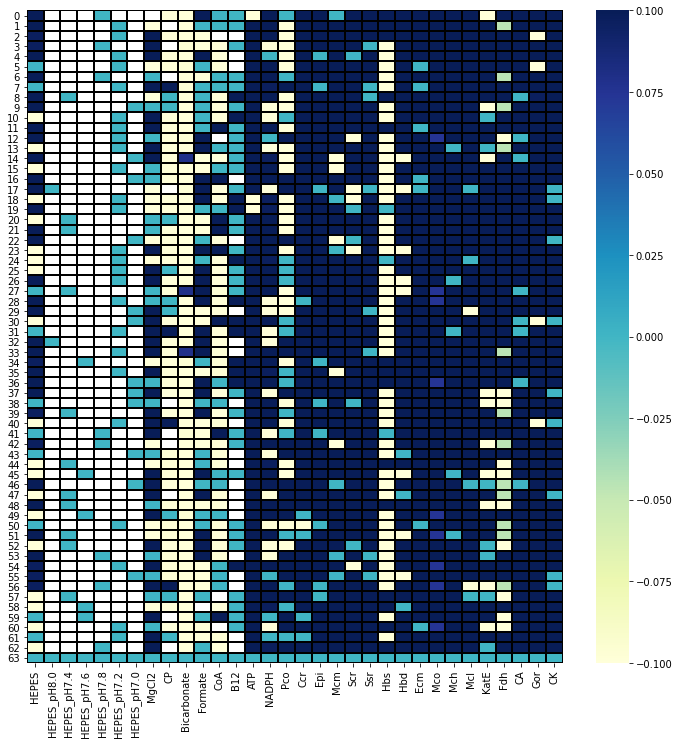

In [ ]:
plt.figure(figsize=(12, 12))
yield_topten_heatmap=sns.heatmap(data=yield_topNormLog, cmap="YlGnBu", linewidths=1, linecolor='black', )

In [ ]:
figure = yield_topten_heatmap.get_figure()  
#figure.savefig('yield_topten_heatmap.png', format='png', dpi=1200)
figure.savefig('yield_topten_heatmap.svg', format='svg', dpi=1200)

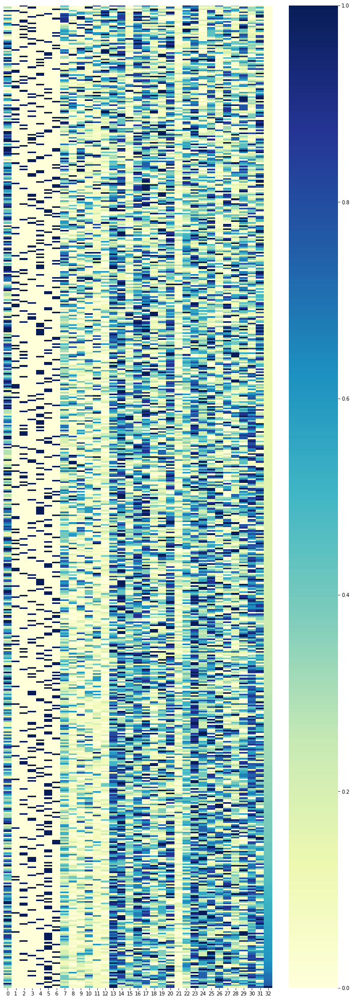

In [ ]:
from sklearn import preprocessing

scaler=preprocessing.MinMaxScaler()
scaled_yields=scaler.fit_transform(yield_all.sort_values(by='yield'))

plt.figure(figsize=(12, 36))
yield_all_heatmap=sns.heatmap(data=scaled_yields, cmap="YlGnBu", xticklabels=True, yticklabels=False)

In [ ]:
figure = yield_all_heatmap.get_figure()  
#figure.savefig('yield_all_heatmap.png', format='png', dpi=1200)
figure.savefig('yield_all_heatmap.svg', format='svg', dpi=1200)

# Other Days

<p1><h2> When to use this part:</h2>
* whene you have either pre existing data (Results_0.csv) or Results_1 to Results_n
<p1><h2> How to use this part:</h2>
* just run all cells!

In [ ]:
day = day_finder('Results') - 1
start_day = (1, 0)[os.path.isfile('Results_0.csv')]
print(start_day, day)

1 8


In [ ]:
desired_cols = []
for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

aggregated_data_m = pd.DataFrame(columns=desired_cols)
aggregated_label_m = pd.DataFrame(columns=['yield'])

for num in range(start_day, day + 1):
    if start_day or num>0:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, days_range[num-1])
    else:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, len(pd.read_csv('Results_0.csv')))

    aggregated_data_m = pd.concat([aggregated_data_m, data_m]).reset_index(drop=True)
    aggregated_label_m = pd.concat([aggregated_label_m, label_m]).reset_index(drop=True)

if 'reference' in specials.keys():
    ref_data = pd.DataFrame(specials['reference'])
    ref_label = pd.DataFrame({'yield':[1.0]})
    aggregated_data_m = pd.concat([aggregated_data_m, ref_data[desired_cols]]).reset_index(drop=True)
    aggregated_label_m = pd.concat([aggregated_label_m, ref_label]).reset_index(drop=True)

aggregated_data_m

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,50,0,0,0,0,0,1,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.818000,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725
1,175,1,0,0,0,0,0,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.271600,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725
2,25,0,1,0,0,0,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.906400,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725
3,25,0,0,0,0,0,1,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.181200,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647
4,50,0,0,1,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.636000,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,150,0,0,0,0,1,0,12.5,40.0,2.5,80.0,0.10,0.0,2,8.75,0.956750,2.15845,6.7005,0.456225,2.615475,2.760,0.533925,0.363600,2.88250,26.00815,1.1344,3.582,0.82065,30.576,0.133400,3.314100,1.56860
996,175,0,0,0,0,0,1,7.5,2.5,5.0,40.0,1.00,0.0,9,6.25,0.956750,2.77515,2.9780,0.456225,1.743650,2.760,1.601775,2.545200,2.30600,46.54090,0.2836,0.796,6.56520,30.576,0.133400,3.590275,1.96075
997,50,0,0,1,0,0,0,10.0,10.0,10.0,10.0,0.00,0.0,8,3.75,4.018350,1.85010,3.7225,0.152075,3.487300,1.104,12.280275,3.272400,2.88250,26.00815,0.2836,2.786,4.92390,13.104,0.150075,5.247325,2.35290
998,175,0,0,0,1,0,0,7.5,2.5,10.0,60.0,2.00,0.0,9,7.50,3.061600,1.23340,1.4890,0.304150,9.590075,2.760,0.533925,0.363600,1.44125,34.22125,1.9852,4.776,4.92390,7.280,0.066700,3.314100,1.56860


In [ ]:
# our ensemble of regressors
# XGBRegressor is an enhanced random forest boosted algorithm
RandomCV = True
if RandomCV:
    # create a default XGBoost classifier
    model = XGBRegressor(objective = 'reg:squarederror')

    # Create the grid search parameter grid and scoring funcitons
    param_grid = {
        "learning_rate": [0.01, 0.03, 0.1, 0.3],
        "colsample_bytree": [0.6, 0.8, 0.9, 1.0],
        "subsample": [0.6, 0.8, 0.9, 1.0],
        "max_depth": [2, 3, 4, 6 , 8],
        "n_estimators": [10, 20,  40, 60, 80, 100, 300, 500],
        "reg_lambda": [1, 1.5, 2],
        "gamma": [0, 0.1, 0.4, 0.6],
        "min_child_weight": [1, 2, 4]}

    # create the grid search object
    grid = RandomizedSearchCV(
        estimator=model, 
        param_distributions=param_grid,
        cv=5,
        scoring= 'neg_mean_absolute_error',
        n_jobs=-1,
        n_iter=n_iter)
    
    print('RandomSearchCV ...')
    grid.fit(aggregated_data_m.values, aggregated_label_m.values)
    results = pd.DataFrame(grid.cv_results_).sort_values('mean_test_score', ascending=False)
    regressors_list = [XGBRegressor(
                       objective = 'reg:squarederror',**param) for param in results.params.iloc[0:ensemble_len,] ]
    print('RandomSearchCV Done!')

else:
    # Default
    regressors_list = [XGBRegressor(
        objective = 'reg:squarederror',
        n_estimators = n,
        learning_rate = l ,
        max_depth = 6,
        min_child_weight = 4,
        subsample = 0.9,
        gamma = 0.4,
        colsample_bytree = 0.9) for n in (10, 20, 30, 40, 50) for l in (0.01, 0.03, 0.1, 0.2)]

RandomSearchCV ...
RandomSearchCV Done!


In [ ]:
pool_size

10000000

In [ ]:
t0 = time.time()

pool_size = 10000 # for when you want to change pool size, default = all possible combinations

Concentrations_n_m = bayesian_optimization(regressors_list, aggregated_data_m, aggregated_label_m, concentrations_limits,
                                           final_order=final_order,
                                           df_main = aggregated_data_m,
                                           reaction_vol_nl=final_reaction_volume_nanoliter, max_nl=maximum_volume_of_model_output,
                                           drop_size_nl=minimum_drop_size_nanoliter,
                                           exploitation=1, exploration=exploration[day+1], test_size=m, pool_size=pool_size, verbose=0,
                                           day=day, days_range = days_range)

print("Passed Time(s): ",time.time()-t0)

Concentrations_n_m

Passed Time(s):  26.499645471572876


,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,100.0,0.0,0.0,1.0,0.0,0.0,0.0,10.0,10.0,20.0,10.0,0.1,0.0,10.0,6.25,2.296200,0.92505,3.7225,0.304150,5.230950,3.864,1.601775,1.4544,1.44125,26.00815,2.5524,3.582,1.64130,30.576,0.016675,1.933225,0.39215
1,175.0,0.0,0.0,0.0,1.0,0.0,0.0,10.0,5.0,20.0,40.0,0.2,0.0,9.0,5.00,5.357800,0.92505,5.9560,1.216600,1.743650,4.416,0.533925,0.3636,0.86475,26.00815,0.2836,1.990,4.92390,7.280,0.066700,4.142625,1.17645
2,200.0,0.0,0.0,0.0,0.0,1.0,0.0,15.0,10.0,60.0,60.0,1.0,0.1,10.0,8.75,5.357800,2.15845,3.7225,1.520750,3.487300,0.552,1.601775,0.7272,0.57650,26.00815,1.1344,11.144,0.82065,7.280,0.166750,2.485575,1.96075
3,125.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,40.0,10.0,5.0,0.2,0.1,3.0,6.25,3.061600,1.85010,2.9780,2.889425,0.871825,1.656,1.601775,1.0908,2.01775,26.00815,2.5524,6.368,6.56520,4.368,0.050025,3.037925,2.35290
4,75.0,0.0,0.0,1.0,0.0,0.0,0.0,12.5,10.0,40.0,40.0,1.0,0.0,6.0,8.75,1.722150,1.85010,4.4670,0.608300,0.871825,1.656,1.601775,3.6360,2.88250,26.00815,2.5524,3.582,8.20650,30.576,0.050025,5.247325,2.35290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,200.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,0.0,5.0,0.0,0.4,0.1,4.0,6.25,2.296200,1.85010,5.9560,0.304150,2.615475,2.208,1.601775,0.3636,0.57650,46.54090,0.5672,1.592,7.38585,30.576,0.116725,4.971150,3.13720
121,100.0,0.0,0.0,0.0,1.0,0.0,0.0,2.5,5.0,40.0,80.0,5.0,0.0,6.0,8.75,7.175625,0.30835,2.2335,1.216600,9.590075,3.864,0.533925,2.5452,2.88250,26.00815,2.8360,4.776,3.28260,7.280,0.066700,1.933225,1.17645
122,50.0,0.0,0.0,0.0,0.0,0.0,1.0,7.5,40.0,20.0,80.0,0.3,0.1,9.0,5.00,3.061600,2.77515,6.7005,0.456225,6.974600,4.968,0.533925,0.3636,2.59425,26.00815,2.2688,0.398,3.28260,13.104,0.083375,0.828525,2.35290
123,50.0,0.0,0.0,0.0,0.0,0.0,1.0,12.5,2.5,5.0,2.5,0.3,0.1,9.0,1.25,5.357800,1.85010,0.7445,2.889425,2.615475,3.312,0.533925,1.4544,1.15300,46.54090,1.9852,4.776,4.92390,23.296,0.033350,1.380875,1.17645


In [ ]:
# add control, reference and other desired combinations
df_specials = [pd.DataFrame(i) for i in specials.values()]
Concentrations_n = pd.concat([Concentrations_n_m, *df_specials]).reset_index(drop=True)

name_folder = 'Day_{}'.format(day+1)
! mkdir -p {name_folder}

Concentrations_n.to_csv('Day_{}/Concentrations_{}.csv'.format(day+1, day+1), index=False)

In [ ]:
# check to dont make repeated combination
df_main = aggregated_data_m

comparison_df = df_main.merge(pd.read_csv('Day_{}/Concentrations_{}.csv'.format(day+1, day+1)).iloc[:m,:],
                              indicator=True,
                              how='outer')

comparison_df._merge.unique()

['left_only', 'right_only']
Categories (2, object): ['left_only', 'right_only']

In [ ]:
# concentration_to_volume
Volumes_n = concentration_to_volume(Concentrations_n, concentrations_limits, reaction_mixture_vol_nl=final_reaction_volume_nanoliter, fixed_parts=fixed_parts)

Volumes_n.to_csv('Day_{}/Volumes_{}.csv'.format(day+1, day+1), index=False)

# Visualising Results as BoxPlot


<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file 
<p1><h2> How to use this part:</h2>
* just run all cells!
* you can change some graphing parameter

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 36.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:1296: UserWarning: 7.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


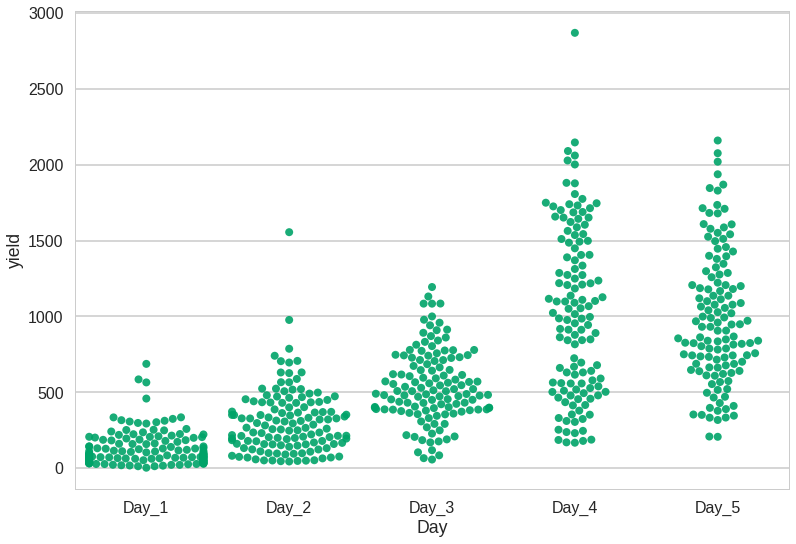

In [ ]:
display_std = False # if you have included "yield_std" column in Results.csv will show it else disply 0 for std
day = day_finder('Results')
start_day = (1, 0)[os.path.isfile('Results_0.csv')]

Results_m = pd.DataFrame(columns=['yield', 'std', 'Day'])
for i in range(start_day, day):
    Results_i = pd.DataFrame(columns=['yield', 'std', 'Day'])
    if start_day:
        Results_i['yield'] = pd.read_csv(f'Results_{i}.csv')['yield'].iloc[0:days_range[i-1]]
    else:
        Results_i['yield'] = pd.read_csv(f'Results_{i}.csv')['yield'].iloc[0:len(pd.read_csv('Results_0.csv'))]

    try:
        if start_day:
            Results_i['std'] = pd.read_csv(f'Results_{i}.csv')['yield_std'].iloc[0:days_range[i-1]]
        else:
            Results_i['std'] = pd.read_csv(f'Results_{i}.csv')['yield_std'].iloc[0:len(pd.read_csv('Results_0.csv'))]

    except:
        Results_i['std'] = 0
    Results_i['Day'] = f'Day_{i}'
    Results_m = pd.concat([Results_m, Results_i])

plt.style.use('seaborn-whitegrid')
plt.style.use('seaborn-poster')
fig, ax = plt.subplots(1, 1)

ax = sns.swarmplot(x='Day', y='yield', data=Results_m, color='#00A368', alpha=0.9, size=8)
#ax = sns.boxplot(x='Day', y='yield', data=Results_m, color='white', fliersize=0, linewidth=4)


if display_std:
    # Find the x,y coordinates for each point
    x_coords = []
    y_coords = []
    for point_pair in ax.collections:
        for x, y in point_pair.get_offsets():
            x_coords.append(x)
            y_coords.append(y)

    errors = Results_m['std']
    ax.errorbar(x_coords, y_coords, yerr=errors, fmt=' ',color="grey", zorder=3, linewidth=1.2)
    print(errors, x_coords, y_coords)

ax

In [ ]:
#fig.savefig(f'Day_{day-1}_Boxplot.png', format='png', dpi=1200)
fig.savefig(f'Day_{day-1}_Boxplot.svg', format='svg', dpi=1200)

# Visualising Results For Each Metabolite

<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file 
<p1><h2> How to use this part:</h2>
* just run all cells!
* you can change some graphing parameter

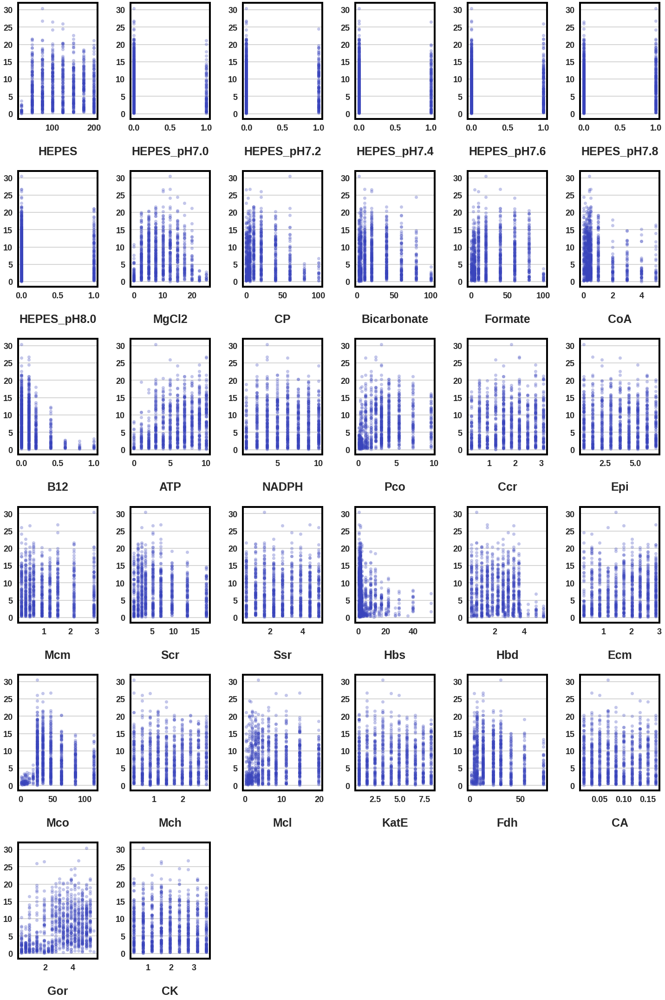

In [ ]:
desired_cols = []
day = day_finder('Results')
start_day = (1, 0)[os.path.isfile('Results_0.csv')]

for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

aggregated_data_m = pd.DataFrame(columns=desired_cols)
aggregated_label_m = pd.DataFrame(columns=['yield'])

for num in range(start_day, day):
    if start_day:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, days_range[num-1])
    else:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, len(pd.read_csv('Results_0.csv')))

    aggregated_data_m = pd.concat([aggregated_data_m, data_m]).reset_index(drop=True)
    aggregated_label_m = pd.concat([aggregated_label_m, label_m]).reset_index(drop=True)

plt.style.use('seaborn-whitegrid')

num = len(desired_cols)
dim = math.ceil(math.sqrt(num))
data = pd.concat([aggregated_data_m, aggregated_label_m], axis=1)

import matplotlib as mpl


mpl.rcParams['axes.linewidth'] = 4.0 #set the value globally
mpl.rcParams['axes.edgecolor'] = 'black' #set the value globally

fig = plt.figure(figsize=(20,30))

for i in range(1, num+1):
    ax = plt.subplot(dim, dim, i)
    ax.xaxis.grid(False)
    ax = sns.scatterplot(x = desired_cols[i-1], y='yield', color='#3944BC', data=data, s=50, linewidth=0, alpha=0.3)
    y_axis = ax.axes.get_yaxis()
    y_axis.set_label_text('foo')
    y_label = y_axis.get_label()
    ##print isinstance(x_label, matplotlib.artist.Artist)
    y_label.set_visible(False)
    #ax.xaxis.set_tick_params()
    plt.xticks(weight = 'bold', fontsize=18)
    plt.yticks(weight = 'bold', fontsize=18)

    plt.xlabel(desired_cols[i-1], labelpad=30 ,fontsize=25, weight='bold')


fig.tight_layout(h_pad=3, w_pad=3)

In [ ]:
#fig.savefig(f'Day_{day-1}_Metabolite_Yield.png', format='png', dpi=1200)
fig.savefig(f'Day_{day-1}_Metabolite_Yield.svg', format='svg', dpi=1200)

# Viualising Concentrations From Day_1 to Now

<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file 
<p1><h2> How to use this part:</h2>
* just run all cells!
* you can change some graphing parameter

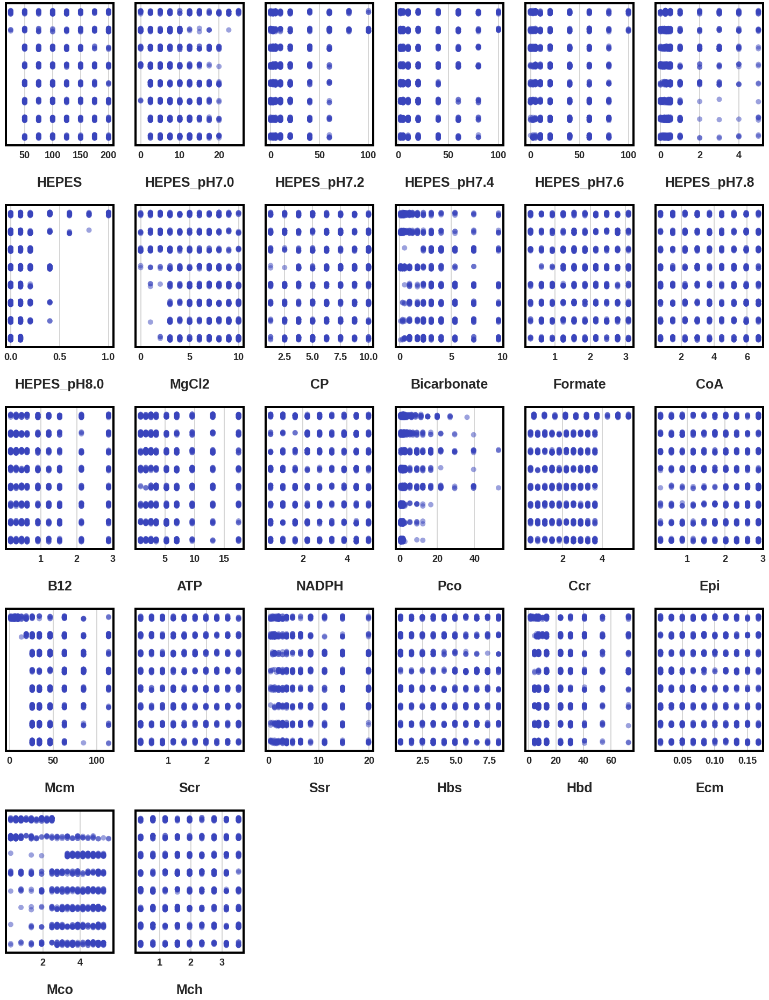

In [ ]:
data_all = pd.DataFrame(columns = list(concentrations_limits.keys())+['day'])
day = day_finder('Results')
desired_cols = []

for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

d = (1, 0)[os.path.isfile('Results_0.csv')]

while os.path.exists(f'Results_{d}.csv'):
    data = pd.read_csv(f'Results_{d}.csv')
    data = data[[*list(concentrations_limits.keys())]]
    data = data.iloc[:days_range[d-1],:]
    data['day'] = f'Day_{d}'
    data_all = pd.concat([data_all, data]).reset_index(drop=True)
    d += 1

import matplotlib as mpl


mpl.rcParams['axes.linewidth'] = 4.0 #set the value globally
mpl.rcParams['axes.edgecolor'] = 'black' #set the value globally
mpl.rcParams['xtick.major.pad'] = 10.0 #set the value globally


num = len(concentrations_limits)
dim = math.ceil(math.sqrt(num))

fig = plt.figure(figsize=(20,30))
for i in range(1, num+1):
    ax = plt.subplot(dim, dim, i)
    ax = sns.stripplot(x=list(concentrations_limits.keys())[i-1], y="day", data=data_all, color='#3944BC', s=10, linewidth=0, alpha=0.5)
    y_axis = ax.axes.get_yaxis()
    y_axis.set_label_text('foo')
    y_label = y_axis.get_label()
    y_label.set_visible(False)

    ax.yaxis.set_ticklabels([])
    plt.xticks(weight = 'bold', fontsize=18)

    plt.xlabel(desired_cols[i-1], labelpad=30 ,fontsize=25, weight='bold')


fig.tight_layout(h_pad=3, w_pad=3)

In [ ]:
fig.savefig(f'Day_{day-1}_Metabolite_Days.png', format='png', dpi=1200)
fig.savefig(f'Day_{day-1}_Metabolite_Days.svg', format='svg', dpi=1200)

# Transform Volumes.csv to Table2Speech Compatible Input

<p1><h2> When to use this part:</h2>
* you have at least one Volumes_n.csv file located in Day_n Folder 
<p1><h2> How to use this part:</h2>
* specify in "which_day" your Volumes file is located
* run all other cells!
* you can download Table2Speech_Volumes_n.csv file from Files

In [ ]:
which_day = 9 # i.e. Volumes_1.csv is in Day_1 Folder

In [ ]:
data = pd.read_csv(f'Day_{which_day}/Volumes_{which_day}.csv')

final_columns = []
columns_name = data.columns
for column in columns_name:
    if "_" in column:
        column_value = column.split('_')[0]
        column_to_add = data[column].unique()
        df_to_add = pd.DataFrame(columns = column_to_add,  data=np.zeros((len(data),len(column_to_add))))
        for i in range(len(data)):
            df_to_add[data[column].iloc[i,]][i] = data[column_value].iloc[i,]
        data = pd.concat([data, df_to_add], axis=1)
        final_columns.remove(column_value)
        final_columns += list(column_to_add)
    else:
        final_columns.append(column)

data = data[final_columns]
data

,pH7.2,pH7.8,pH7.6,pH7.4,pH8.0,pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,Substrate,water
0,1000.0,0.0,0.0,0.0,0.0,0.0,50.0,200.0,100.0,400.0,100.0,0.0,200.0,100.0,800.0,50.0,200.0,350.0,200.0,125.0,25.0,150.0,250.0,475.0,25.0,300.0,25.0,125.0,100.0,350.0,25.0,1000.0,3275.0
1,0.0,1750.0,0.0,0.0,0.0,0.0,50.0,400.0,200.0,600.0,250.0,0.0,200.0,175.0,1400.0,175.0,150.0,50.0,100.0,200.0,75.0,75.0,175.0,625.0,175.0,225.0,50.0,125.0,50.0,400.0,225.0,1000.0,1100.0
2,0.0,0.0,1250.0,0.0,0.0,0.0,125.0,100.0,25.0,200.0,75.0,0.0,125.0,150.0,1400.0,100.0,125.0,25.0,75.0,75.0,75.0,100.0,125.0,475.0,100.0,400.0,225.0,525.0,250.0,250.0,25.0,1000.0,2600.0
3,0.0,1500.0,0.0,0.0,0.0,0.0,75.0,1200.0,50.0,100.0,125.0,200.0,250.0,125.0,600.0,75.0,150.0,200.0,50.0,225.0,75.0,25.0,75.0,625.0,175.0,700.0,25.0,225.0,100.0,125.0,200.0,1000.0,1725.0
4,0.0,0.0,0.0,500.0,0.0,0.0,75.0,800.0,25.0,100.0,50.0,0.0,75.0,50.0,1050.0,250.0,200.0,50.0,50.0,125.0,25.0,75.0,200.0,475.0,150.0,300.0,50.0,225.0,125.0,325.0,225.0,1000.0,3425.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,2000.0,0.0,0.0,0.0,0.0,0.0,50.0,1200.0,100.0,200.0,75.0,0.0,150.0,175.0,1400.0,125.0,75.0,150.0,200.0,75.0,75.0,150.0,50.0,1150.0,75.0,175.0,50.0,400.0,225.0,375.0,50.0,1000.0,250.0
123,0.0,0.0,750.0,0.0,0.0,0.0,25.0,100.0,50.0,600.0,75.0,0.0,200.0,50.0,25.0,175.0,50.0,25.0,200.0,25.0,425.0,175.0,250.0,625.0,175.0,300.0,100.0,125.0,100.0,425.0,225.0,1000.0,3725.0
124,0.0,0.0,0.0,750.0,0.0,0.0,25.0,0.0,200.0,800.0,0.0,0.0,100.0,75.0,250.0,125.0,100.0,100.0,100.0,100.0,425.0,175.0,75.0,625.0,225.0,125.0,50.0,125.0,125.0,425.0,50.0,1000.0,3850.0
125,0.0,0.0,1000.0,0.0,0.0,0.0,50.0,400.0,500.0,200.0,125.0,200.0,50.0,100.0,800.0,50.0,25.0,50.0,75.0,25.0,250.0,50.0,50.0,400.0,25.0,175.0,50.0,250.0,25.0,100.0,25.0,1000.0,3950.0


In [ ]:
data.to_csv(f'Table2Speech_Volumes_{which_day}.csv', index=False)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Transform Volumes.csv to ECHO liquid Handler Compatible Input

<p1><h2> When to use this part:</h2>
* you have at least one Volumes_n.csv file located in Day_n Folder 
<p1><h2> How to use this part:</h2>
* specify in "which_day" your Volumes file is located
* run all other cells!
* you can download Echo_Input_n.csv file from Files

In [ ]:
which_day = 9 # i.e. Volumes_1.csv is in Day_1 Folder
plate_384_well = True
triplicate = True

In [ ]:
data = pd.read_csv(f'Day_{which_day}/Volumes_{which_day}.csv')

final_columns = []
columns_name = data.columns
for column in columns_name:
    if "_" in column:
        column_value = column.split('_')[0]
        column_to_add = data[column].unique()
        df_to_add = pd.DataFrame(columns = column_to_add,  data=np.zeros((len(data),len(column_to_add))))
        for i in range(len(data)):
            df_to_add[data[column].iloc[i,]][i] = data[column_value].iloc[i,]
        data = pd.concat([data, df_to_add], axis=1)
        final_columns.remove(column_value)
        final_columns += list(column_to_add)
    else:
        final_columns.append(column)

data = data[final_columns]
data

,pH7.2,pH7.8,pH7.6,pH7.4,pH8.0,pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,Substrate,water
0,1000.0,0.0,0.0,0.0,0.0,0.0,50.0,200.0,100.0,400.0,100.0,0.0,200.0,100.0,800.0,50.0,200.0,350.0,200.0,125.0,25.0,150.0,250.0,475.0,25.0,300.0,25.0,125.0,100.0,350.0,25.0,1000.0,3275.0
1,0.0,1750.0,0.0,0.0,0.0,0.0,50.0,400.0,200.0,600.0,250.0,0.0,200.0,175.0,1400.0,175.0,150.0,50.0,100.0,200.0,75.0,75.0,175.0,625.0,175.0,225.0,50.0,125.0,50.0,400.0,225.0,1000.0,1100.0
2,0.0,0.0,1250.0,0.0,0.0,0.0,125.0,100.0,25.0,200.0,75.0,0.0,125.0,150.0,1400.0,100.0,125.0,25.0,75.0,75.0,75.0,100.0,125.0,475.0,100.0,400.0,225.0,525.0,250.0,250.0,25.0,1000.0,2600.0
3,0.0,1500.0,0.0,0.0,0.0,0.0,75.0,1200.0,50.0,100.0,125.0,200.0,250.0,125.0,600.0,75.0,150.0,200.0,50.0,225.0,75.0,25.0,75.0,625.0,175.0,700.0,25.0,225.0,100.0,125.0,200.0,1000.0,1725.0
4,0.0,0.0,0.0,500.0,0.0,0.0,75.0,800.0,25.0,100.0,50.0,0.0,75.0,50.0,1050.0,250.0,200.0,50.0,50.0,125.0,25.0,75.0,200.0,475.0,150.0,300.0,50.0,225.0,125.0,325.0,225.0,1000.0,3425.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,2000.0,0.0,0.0,0.0,0.0,0.0,50.0,1200.0,100.0,200.0,75.0,0.0,150.0,175.0,1400.0,125.0,75.0,150.0,200.0,75.0,75.0,150.0,50.0,1150.0,75.0,175.0,50.0,400.0,225.0,375.0,50.0,1000.0,250.0
123,0.0,0.0,750.0,0.0,0.0,0.0,25.0,100.0,50.0,600.0,75.0,0.0,200.0,50.0,25.0,175.0,50.0,25.0,200.0,25.0,425.0,175.0,250.0,625.0,175.0,300.0,100.0,125.0,100.0,425.0,225.0,1000.0,3725.0
124,0.0,0.0,0.0,750.0,0.0,0.0,25.0,0.0,200.0,800.0,0.0,0.0,100.0,75.0,250.0,125.0,100.0,100.0,100.0,100.0,425.0,175.0,75.0,625.0,225.0,125.0,50.0,125.0,125.0,425.0,50.0,1000.0,3850.0
125,0.0,0.0,1000.0,0.0,0.0,0.0,50.0,400.0,500.0,200.0,125.0,200.0,50.0,100.0,800.0,50.0,25.0,50.0,75.0,25.0,250.0,50.0,50.0,400.0,25.0,175.0,50.0,250.0,25.0,100.0,25.0,1000.0,3950.0


In [ ]:
if triplicate:
    intermediates = []
    intermediates.append(put_volumes_to_384_wells(data, starting_well='A1', vertical=True, make_csv=False))
    intermediates.append(put_volumes_to_384_wells(data, starting_well='A9', vertical=True, make_csv=False))
    intermediates.append(put_volumes_to_384_wells(data, starting_well='A17', vertical=True, make_csv=False))
else:
    intermediate = put_volumes_to_384_wells(data, starting_well='A1', vertical=False, make_csv=False)
    intermediate[1]

intermediates[2][1]

,pH7.2,pH7.8,pH7.6,pH7.4,pH8.0,pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,Substrate,water,well_name
0,1000.0,0.0,0.0,0.0,0.0,0.0,50.0,200.0,100.0,400.0,100.0,0.0,200.0,100.0,800.0,50.0,200.0,350.0,200.0,125.0,25.0,150.0,250.0,475.0,25.0,300.0,25.0,125.0,100.0,350.0,25.0,1000.0,3275.0,A17
1,0.0,1750.0,0.0,0.0,0.0,0.0,50.0,400.0,200.0,600.0,250.0,0.0,200.0,175.0,1400.0,175.0,150.0,50.0,100.0,200.0,75.0,75.0,175.0,625.0,175.0,225.0,50.0,125.0,50.0,400.0,225.0,1000.0,1100.0,B17
2,0.0,0.0,1250.0,0.0,0.0,0.0,125.0,100.0,25.0,200.0,75.0,0.0,125.0,150.0,1400.0,100.0,125.0,25.0,75.0,75.0,75.0,100.0,125.0,475.0,100.0,400.0,225.0,525.0,250.0,250.0,25.0,1000.0,2600.0,C17
3,0.0,1500.0,0.0,0.0,0.0,0.0,75.0,1200.0,50.0,100.0,125.0,200.0,250.0,125.0,600.0,75.0,150.0,200.0,50.0,225.0,75.0,25.0,75.0,625.0,175.0,700.0,25.0,225.0,100.0,125.0,200.0,1000.0,1725.0,D17
4,0.0,0.0,0.0,500.0,0.0,0.0,75.0,800.0,25.0,100.0,50.0,0.0,75.0,50.0,1050.0,250.0,200.0,50.0,50.0,125.0,25.0,75.0,200.0,475.0,150.0,300.0,50.0,225.0,125.0,325.0,225.0,1000.0,3425.0,E17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,2000.0,0.0,0.0,0.0,0.0,0.0,50.0,1200.0,100.0,200.0,75.0,0.0,150.0,175.0,1400.0,125.0,75.0,150.0,200.0,75.0,75.0,150.0,50.0,1150.0,75.0,175.0,50.0,400.0,225.0,375.0,50.0,1000.0,250.0,K24
123,0.0,0.0,750.0,0.0,0.0,0.0,25.0,100.0,50.0,600.0,75.0,0.0,200.0,50.0,25.0,175.0,50.0,25.0,200.0,25.0,425.0,175.0,250.0,625.0,175.0,300.0,100.0,125.0,100.0,425.0,225.0,1000.0,3725.0,L24
124,0.0,0.0,0.0,750.0,0.0,0.0,25.0,0.0,200.0,800.0,0.0,0.0,100.0,75.0,250.0,125.0,100.0,100.0,100.0,100.0,425.0,175.0,75.0,625.0,225.0,125.0,50.0,125.0,125.0,425.0,50.0,1000.0,3850.0,M24
125,0.0,0.0,1000.0,0.0,0.0,0.0,50.0,400.0,500.0,200.0,125.0,200.0,50.0,100.0,800.0,50.0,25.0,50.0,75.0,25.0,250.0,50.0,50.0,400.0,25.0,175.0,50.0,250.0,25.0,100.0,25.0,1000.0,3950.0,N24


In [ ]:
intermediate_final = pd.concat([intermediates[i][1] for i in range(3)])
intermediate_final = intermediate_final.reset_index(drop=True)
intermediate_final

,pH7.2,pH7.8,pH7.6,pH7.4,pH8.0,pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,Substrate,water,well_name
0,1000.0,0.0,0.0,0.0,0.0,0.0,50.0,200.0,100.0,400.0,100.0,0.0,200.0,100.0,800.0,50.0,200.0,350.0,200.0,125.0,25.0,150.0,250.0,475.0,25.0,300.0,25.0,125.0,100.0,350.0,25.0,1000.0,3275.0,A1
1,0.0,1750.0,0.0,0.0,0.0,0.0,50.0,400.0,200.0,600.0,250.0,0.0,200.0,175.0,1400.0,175.0,150.0,50.0,100.0,200.0,75.0,75.0,175.0,625.0,175.0,225.0,50.0,125.0,50.0,400.0,225.0,1000.0,1100.0,B1
2,0.0,0.0,1250.0,0.0,0.0,0.0,125.0,100.0,25.0,200.0,75.0,0.0,125.0,150.0,1400.0,100.0,125.0,25.0,75.0,75.0,75.0,100.0,125.0,475.0,100.0,400.0,225.0,525.0,250.0,250.0,25.0,1000.0,2600.0,C1
3,0.0,1500.0,0.0,0.0,0.0,0.0,75.0,1200.0,50.0,100.0,125.0,200.0,250.0,125.0,600.0,75.0,150.0,200.0,50.0,225.0,75.0,25.0,75.0,625.0,175.0,700.0,25.0,225.0,100.0,125.0,200.0,1000.0,1725.0,D1
4,0.0,0.0,0.0,500.0,0.0,0.0,75.0,800.0,25.0,100.0,50.0,0.0,75.0,50.0,1050.0,250.0,200.0,50.0,50.0,125.0,25.0,75.0,200.0,475.0,150.0,300.0,50.0,225.0,125.0,325.0,225.0,1000.0,3425.0,E1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376,2000.0,0.0,0.0,0.0,0.0,0.0,50.0,1200.0,100.0,200.0,75.0,0.0,150.0,175.0,1400.0,125.0,75.0,150.0,200.0,75.0,75.0,150.0,50.0,1150.0,75.0,175.0,50.0,400.0,225.0,375.0,50.0,1000.0,250.0,K24
377,0.0,0.0,750.0,0.0,0.0,0.0,25.0,100.0,50.0,600.0,75.0,0.0,200.0,50.0,25.0,175.0,50.0,25.0,200.0,25.0,425.0,175.0,250.0,625.0,175.0,300.0,100.0,125.0,100.0,425.0,225.0,1000.0,3725.0,L24
378,0.0,0.0,0.0,750.0,0.0,0.0,25.0,0.0,200.0,800.0,0.0,0.0,100.0,75.0,250.0,125.0,100.0,100.0,100.0,100.0,425.0,175.0,75.0,625.0,225.0,125.0,50.0,125.0,125.0,425.0,50.0,1000.0,3850.0,M24
379,0.0,0.0,1000.0,0.0,0.0,0.0,50.0,400.0,500.0,200.0,125.0,200.0,50.0,100.0,800.0,50.0,25.0,50.0,75.0,25.0,250.0,50.0,50.0,400.0,25.0,175.0,50.0,250.0,25.0,100.0,25.0,1000.0,3950.0,N24


In [ ]:
echo_input = source_to_destination(intermediate_final, desired_order=None, reset_index=True, check_zero=False)
echo_input[1]

,Source_Plate_Barcode,Source_Well,Destination_Plate_Barcode,Destination_Well,Transfer_Volume
0,Plate1,pH7.2 well,destPlate1,A1,1000.0
1,Plate1,pH7.2 well,destPlate1,B1,0.0
2,Plate1,pH7.2 well,destPlate1,C1,0.0
3,Plate1,pH7.2 well,destPlate1,D1,0.0
4,Plate1,pH7.2 well,destPlate1,E1,0.0
...,...,...,...,...,...
12568,Plate1,water well,destPlate1,K24,250.0
12569,Plate1,water well,destPlate1,L24,3725.0
12570,Plate1,water well,destPlate1,M24,3850.0
12571,Plate1,water well,destPlate1,N24,3950.0


In [ ]:
echo_input[1].to_csv(f'Echo_Input_{which_day}.csv', index=False)

In [ ]:
#echo_input[0]['PEG']

# Find K Most Informative Combinations

<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file </p1>
<p1><h2> How to use this part:</h2>
* specify in "k" i.e. how many Combinations you want to get 
* run all other cells!
* you can download K_Most_Informative_Combinations.csv file from Files that contain index of most informative combinations for 5 iterations</p1>

In [ ]:
k = 20
number_try = 2000

In [ ]:
day = day_finder('Results') - 1
start_day = (1, 0)[os.path.isfile('Results_0.csv')]

desired_cols = []
for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

aggregated_data_m = pd.DataFrame(columns=desired_cols)
aggregated_label_m = pd.DataFrame(columns=['yield'])

for num in range(start_day, day + 1):
    if start_day or num>0:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, days_range[num-1])
    else:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, len(pd.read_csv('Results_0.csv')))

    aggregated_data_m = pd.concat([aggregated_data_m, data_m]).reset_index(drop=True)
    aggregated_label_m = pd.concat([aggregated_label_m, label_m]).reset_index(drop=True)


aggregated_data_m

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,50,0,0,0,0,0,1,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.818000,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725
1,175,1,0,0,0,0,0,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.271600,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725
2,25,0,1,0,0,0,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.906400,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725
3,25,0,0,0,0,0,1,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.181200,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647
4,50,0,0,1,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.636000,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,150,0,0,0,0,1,0,12.5,40.0,2.5,80.0,0.10,0.0,2,8.75,0.956750,2.15845,6.7005,0.456225,2.615475,2.760,0.533925,0.363600,2.88250,26.00815,1.1344,3.582,0.82065,30.576,0.133400,3.314100,1.56860
996,175,0,0,0,0,0,1,7.5,2.5,5.0,40.0,1.00,0.0,9,6.25,0.956750,2.77515,2.9780,0.456225,1.743650,2.760,1.601775,2.545200,2.30600,46.54090,0.2836,0.796,6.56520,30.576,0.133400,3.590275,1.96075
997,50,0,0,1,0,0,0,10.0,10.0,10.0,10.0,0.00,0.0,8,3.75,4.018350,1.85010,3.7225,0.152075,3.487300,1.104,12.280275,3.272400,2.88250,26.00815,0.2836,2.786,4.92390,13.104,0.150075,5.247325,2.35290
998,175,0,0,0,1,0,0,7.5,2.5,10.0,60.0,2.00,0.0,9,7.50,3.061600,1.23340,1.4890,0.304150,9.590075,2.760,0.533925,0.363600,1.44125,34.22125,1.9852,4.776,4.92390,7.280,0.066700,3.314100,1.56860


In [ ]:
# Create the grid search parameter grid and scoring funcitons
param_grid = {
        "learning_rate": [0.01, 0.03, 0.1, 0.3],
        "colsample_bytree": [0.6, 0.8, 0.9, 1.0],
        "subsample": [0.6, 0.8, 0.9, 1.0],
        "max_depth": [2, 3, 4, 6 , 8],
        "n_estimators": [10, 20,  40, 60, 80, 100, 300, 500],
        "reg_lambda": [1, 1.5, 2],
        "gamma": [0, 0.1, 0.4, 0.6],
        "min_child_weight": [1, 2, 4]}

# create the grid search object
grid = RandomizedSearchCV(
        estimator=model, 
        param_distributions=param_grid,
        cv=5,
        scoring= 'neg_mean_absolute_error',
        n_jobs=-1,
        n_iter=n_iter)
    
print('RandomSearchCV ...')
grid.fit(aggregated_data_m.values, aggregated_label_m.values)
results = pd.DataFrame(grid.cv_results_).sort_values('mean_test_score', ascending=False)
print('RandomSearchCV Done!')

RandomSearchCV ...
RandomSearchCV Done!


In [ ]:
indexs = []
num = 0
while num < number_try:
    numbers = set()
    while len(numbers) < k:
        numbers.add(random.randint(0, len(aggregated_data_m)-1))
    indexs.append(numbers)
    num += 1

In [ ]:
performance = []
best_param = results.params.iloc[0,]
all_set = set(range(len(aggregated_data_m)))
counter = 0
for index in indexs:
    counter += 1
    if counter%100 == 0:print(counter)
    index_test = all_set - index
    index_test = list(index_test)
    index = list(index)
    model = XGBRegressor(objective = 'reg:squarederror', **best_param)
    model.fit(aggregated_data_m.iloc[index].values, aggregated_label_m.iloc[index].values)
    performance.append(spearmanr(model.predict(aggregated_data_m.iloc[index_test].values), aggregated_label_m.iloc[index_test].values).correlation**2)

performance = np.array(performance)

100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000


In [ ]:
number_to_select = 5
ind = np.argpartition(performance, -number_to_select)[-number_to_select:]
performance[ind]

array([0.37630835, 0.43609247, 0.3963268 , 0.38213278, 0.40489622])

In [ ]:
np.array(indexs)[ind]

array([{896, 387, 653, 281, 409, 678, 431, 560, 447, 202, 207, 977, 214, 342, 97, 230, 617, 877, 630, 248},
       {509, 643, 650, 268, 153, 922, 936, 816, 177, 951, 824, 56, 203, 348, 106, 495, 245, 631, 760, 765},
       {512, 649, 908, 525, 663, 669, 804, 551, 943, 432, 952, 569, 198, 845, 466, 96, 102, 743, 497, 116},
       {271, 17, 659, 162, 421, 41, 297, 683, 821, 953, 446, 708, 968, 842, 975, 597, 230, 874, 110, 624},
       {902, 262, 922, 798, 159, 298, 310, 315, 449, 74, 843, 989, 991, 485, 870, 363, 108, 623, 882, 893}],
      dtype=object)

In [ ]:
pd.DataFrame(np.array(indexs)[ind]).to_csv('K_Most_Informative_Combinations.csv', index=False)

# Find Feature Importances


<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file </p1>
<p1><h2> How to use this part:</h2>
* run all cells!
* you can download importance_df.csv  from Files</p1>

In [ ]:
n_iter = 200

In [ ]:
day = day_finder('Results') - 1
start_day = (1, 0)[os.path.isfile('Results_0.csv')]

desired_cols = []
for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

In [ ]:
importance_list = []
print('This may takes minutes!')

for day_i in range(1, day+1):
    aggregated_data_m = pd.DataFrame(columns=desired_cols)
    aggregated_label_m = pd.DataFrame(columns=['yield'])

    for num in range(start_day, day_i + 1):
        if start_day or num>0:
            data_m, label_m, _, _= result_preprocess(num, desired_cols, days_range[num-1])
        else:
            data_m, label_m, _, _= result_preprocess(num, desired_cols, len(pd.read_csv('Results_0.csv')))

        aggregated_data_m = pd.concat([aggregated_data_m, data_m]).reset_index(drop=True)
        aggregated_label_m = pd.concat([aggregated_label_m, label_m]).reset_index(drop=True)

    # Create the grid search parameter grid and scoring funcitons
    param_grid = {
        "learning_rate": [0.01, 0.03, 0.1, 0.3],
        "colsample_bytree": [0.6, 0.8, 0.9, 1.0],
        "subsample": [0.6, 0.8, 0.9, 1.0],
        "max_depth": [2, 3, 4, 6 , 8],
        "n_estimators": [10, 20,  40, 60, 80, 100, 300, 500],
        "reg_lambda": [1, 1.5, 2],
        "gamma": [0, 0.1, 0.4, 0.6],
        "min_child_weight": [1, 2, 4]}

    # creat estimator
    model = XGBRegressor(objective = 'reg:squarederror')

    # create the grid search object
    grid = RandomizedSearchCV(
        estimator=model, 
        param_distributions=param_grid,
        cv=5,
        scoring= 'neg_mean_absolute_error',
        n_jobs=-1,
        n_iter=n_iter)
    
    print('RandomSearchCV ...', day_i)
    grid.fit(aggregated_data_m.values, aggregated_label_m.values)
    results = pd.DataFrame(grid.cv_results_).sort_values('mean_test_score', ascending=False)
    print('RandomSearchCV Done!')

    model = XGBRegressor(objective = 'reg:squarederror', **results.params.iloc[0,])
    model.fit(aggregated_data_m.values, aggregated_label_m.values)
    importance_list.append(model.feature_importances_)

This may takes minutes!
RandomSearchCV ... 1
RandomSearchCV Done!
RandomSearchCV ... 2
RandomSearchCV Done!
RandomSearchCV ... 3
RandomSearchCV Done!
RandomSearchCV ... 4
RandomSearchCV Done!
RandomSearchCV ... 5
RandomSearchCV Done!
RandomSearchCV ... 6
RandomSearchCV Done!
RandomSearchCV ... 7
RandomSearchCV Done!
RandomSearchCV ... 8
RandomSearchCV Done!


In [ ]:
importance_df = pd.DataFrame(importance_list, columns=aggregated_data_m.columns)
importance_df

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,0.059805,0.013514,0.007762,0.039622,0.041092,0.015006,0.023590,0.021608,0.067430,0.032850,0.016593,0.038543,0.064815,0.039905,0.020624,0.030460,0.016513,0.031270,0.017688,0.062998,0.027829,0.033069,0.023846,0.022446,0.054763,0.022876,0.021800,0.021181,0.019824,0.037485,0.040131,0.013062
1,0.041499,0.003296,0.013315,0.019285,0.010625,0.019698,0.019754,0.026529,0.025283,0.028371,0.033427,0.030273,0.085643,0.043167,0.039346,0.058784,0.023224,0.019366,0.035674,0.033808,0.033435,0.022926,0.030700,0.018425,0.050956,0.028579,0.037675,0.031327,0.041164,0.021897,0.045209,0.027340
2,0.033414,0.015456,0.020465,0.010502,0.011917,0.010573,0.016872,0.024865,0.023900,0.023549,0.020232,0.015750,0.053499,0.022720,0.032869,0.102152,0.019316,0.015136,0.019481,0.022135,0.020175,0.027671,0.020590,0.021618,0.062397,0.015031,0.038897,0.019026,0.037247,0.026416,0.177006,0.019123
3,0.016755,0.015165,0.006311,0.009631,0.014392,0.091845,0.008359,0.025739,0.019067,0.019482,0.028394,0.024839,0.031789,0.046577,0.030929,0.039786,0.033455,0.016483,0.018479,0.019674,0.020949,0.032787,0.030501,0.032892,0.061896,0.023246,0.044590,0.039240,0.030662,0.023503,0.113066,0.029516
4,0.013327,0.022629,0.016794,0.005328,0.011585,0.023412,0.006109,0.035679,0.024594,0.027984,0.021762,0.040714,0.024741,0.043235,0.023454,0.061199,0.030465,0.017259,0.015288,0.026274,0.026572,0.051651,0.013310,0.027602,0.085114,0.016973,0.058773,0.018818,0.038729,0.015492,0.135596,0.019538
5,0.014416,0.020221,0.013050,0.005803,0.008350,0.023171,0.012484,0.064764,0.031666,0.024285,0.022507,0.041500,0.085515,0.071883,0.019037,0.065555,0.018623,0.013673,0.011194,0.027764,0.014650,0.078701,0.014123,0.016726,0.061666,0.013862,0.033923,0.015318,0.025332,0.014963,0.104375,0.010902
6,0.016686,0.032179,0.009703,0.013892,0.024809,0.033490,0.012423,0.049650,0.022344,0.022196,0.029496,0.040454,0.121424,0.042239,0.021541,0.053019,0.013684,0.012990,0.011202,0.029050,0.014453,0.103303,0.010273,0.014190,0.067005,0.012555,0.026928,0.013481,0.034319,0.013780,0.066472,0.010769
7,0.015875,0.019874,0.011538,0.009224,0.012091,0.027111,0.018885,0.050985,0.020006,0.030031,0.028585,0.042923,0.140118,0.045808,0.019744,0.049004,0.019428,0.015602,0.010575,0.025129,0.012954,0.120357,0.015374,0.010296,0.066762,0.012582,0.026344,0.012209,0.033955,0.013153,0.053869,0.009609


In [ ]:
importance_df.to_csv('importance_df.csv', index=False)

* find feature importance through 
sklearn.feature_selection.mutual_info_regression

In [ ]:
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler_x = StandardScaler()
X = scaler_x.fit_transform(aggregated_data_m.values)
scaler_y = StandardScaler()
y = scaler_y.fit_transform(aggregated_label_m.values)

In [ ]:
importance_df_sklearn = pd.DataFrame(mutual_info_regression(X, y)).T
importance_df_sklearn.columns = aggregated_data_m.columns
importance_df_sklearn

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,0.065205,0.0,0.0,0.013998,0.0,0.01092,0.0,0.114174,0.046392,0.047109,0.01697,0.091735,0.119356,0.065798,0.020549,0.114166,0.040922,0.029765,0.0,0.036289,0.0,0.23834,0.149554,0.001961,0.179983,0.0,0.047889,0.017911,0.1127,0.008673,0.150953,0.040771


In [ ]:
importance_df_sklearn.to_csv('importance_df_sklearn.csv', index=False)


No handles with labels found to put in legend.


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 <a list of 32 Text major ticklabel objects>)

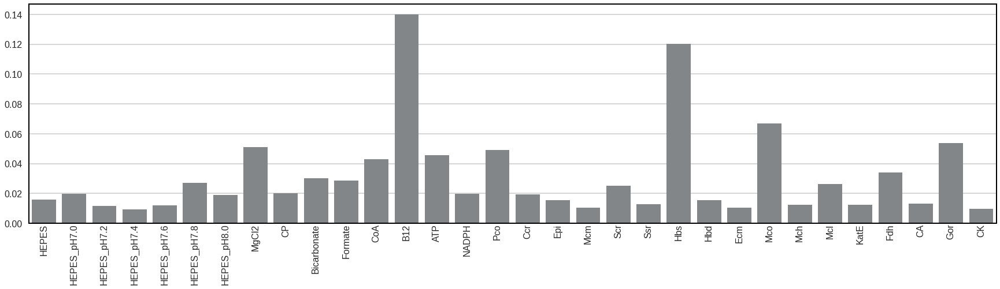

In [ ]:
import matplotlib as mpl


mpl.rcParams['axes.linewidth'] = 2.0 #set the value globally
mpl.rcParams['axes.edgecolor'] = 'black' #set the value globally
mpl.rcParams['xtick.major.pad'] = 1.0 #set the value globally

fig, ax = plt.subplots()

#ax = sns.barplot(data=importance_df, color='#818689')
ax = sns.barplot(data=importance_df.iloc[[len(importance_df)-1]], color='#818689')
#ax = plt.plot(list(importance_df.iloc[[len(importance_df)-1]].values[0]), marker='o', markersize=10, ls='', color='#F2B342', label='Last Round')

fig.set_size_inches(30, 7)
plt.legend()
plt.xticks(rotation=90)

# Find NonLinear Interactions

<p1><h2> When to use this part:</h2>
* you have at least one Results.csv file </p1>
<p1><h2> How to use this part:</h2>
* run all cells!
* you can download Interactions.png from Files</p1>

In [ ]:
day = day_finder('Results') - 1
start_day = (1, 0)[os.path.isfile('Results_0.csv')]

desired_cols = []
for key, value in concentrations_limits.items():
    if value['Alternatives']:
        desired_cols.append(key)
        alternative_name = ['{}_{}'.format(key, i) for i in value['Alternatives']]
        desired_cols += alternative_name
    else:
        desired_cols.append(key)

final_order = desired_cols

aggregated_data_m = pd.DataFrame(columns=desired_cols)
aggregated_label_m = pd.DataFrame(columns=['yield'])

for num in range(start_day, day + 1):
    if start_day or num>0:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, days_range[num-1])
    else:
        data_m, label_m, _, _= result_preprocess(num, desired_cols, len(pd.read_csv('Results_0.csv')))

    aggregated_data_m = pd.concat([aggregated_data_m, data_m]).reset_index(drop=True)
    aggregated_label_m = pd.concat([aggregated_label_m, label_m]).reset_index(drop=True)


aggregated_data_m

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
0,50,0,0,0,0,0,1,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.818000,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725
1,175,1,0,0,0,0,0,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.271600,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725
2,25,0,1,0,0,0,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.906400,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725
3,25,0,0,0,0,0,1,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.181200,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647
4,50,0,0,1,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.636000,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,150,0,0,0,0,1,0,12.5,40.0,2.5,80.0,0.10,0.0,2,8.75,0.956750,2.15845,6.7005,0.456225,2.615475,2.760,0.533925,0.363600,2.88250,26.00815,1.1344,3.582,0.82065,30.576,0.133400,3.314100,1.56860
996,175,0,0,0,0,0,1,7.5,2.5,5.0,40.0,1.00,0.0,9,6.25,0.956750,2.77515,2.9780,0.456225,1.743650,2.760,1.601775,2.545200,2.30600,46.54090,0.2836,0.796,6.56520,30.576,0.133400,3.590275,1.96075
997,50,0,0,1,0,0,0,10.0,10.0,10.0,10.0,0.00,0.0,8,3.75,4.018350,1.85010,3.7225,0.152075,3.487300,1.104,12.280275,3.272400,2.88250,26.00815,0.2836,2.786,4.92390,13.104,0.150075,5.247325,2.35290
998,175,0,0,0,1,0,0,7.5,2.5,10.0,60.0,2.00,0.0,9,7.50,3.061600,1.23340,1.4890,0.304150,9.590075,2.760,0.533925,0.363600,1.44125,34.22125,1.9852,4.776,4.92390,7.280,0.066700,3.314100,1.56860


In [ ]:
from sklearn.linear_model import LinearRegression
from itertools import combinations

model = LinearRegression()
model.fit(aggregated_data_m.values, aggregated_label_m.values)
baseline_score = pearsonr(pd.DataFrame(model.predict(aggregated_data_m.values))[0] ,aggregated_label_m['yield'])
baseline_score

(0.6799017292107503, 1.3254138303467135e-136)

In [ ]:
interaction_scores = {}
for i in combinations(aggregated_data_m.columns, 2):
    X = pd.concat([aggregated_data_m, (aggregated_data_m[i[0]] * aggregated_data_m[i[1]])], axis=1)
    y = aggregated_label_m

    model = LinearRegression()
    model.fit(X.values, y.values)
    score = pearsonr(pd.DataFrame(model.predict(X.values))[0] ,y['yield'])

    interaction_scores[i] = score

In [ ]:
interactions_df = pd.DataFrame(data=np.zeros([len(aggregated_data_m.columns), len(aggregated_data_m.columns)]), columns=aggregated_data_m.columns, index=aggregated_data_m.columns)

for columns, value in interaction_scores.items():
    diff = value[0] - baseline_score[0]
    interactions_df[columns[0]][columns[1]] = diff

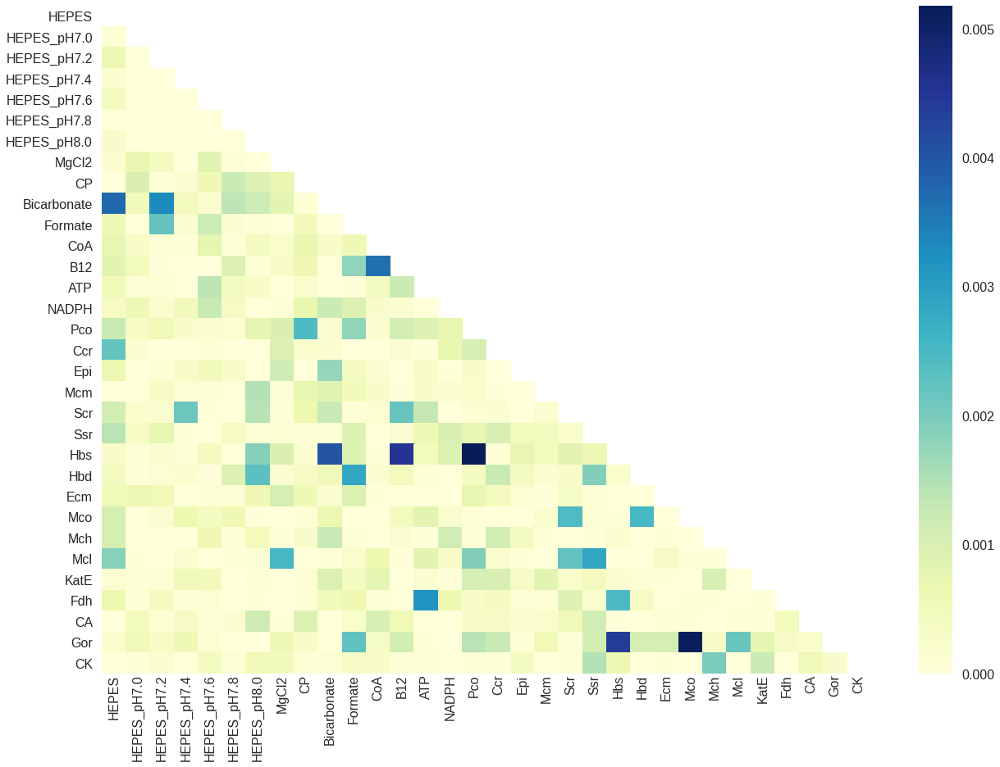

In [ ]:
corr = np.corrcoef(np.random.randn(len(aggregated_data_m.columns), 200))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize = (21,15))
ax = sns.heatmap(interactions_df, mask=mask, cmap='YlGnBu')

In [ ]:
fig.savefig('Interactions.png', format='png', dpi=1200)
fig.savefig('Interactions.svg', format='svg', dpi=1200)

#Data analysis:



**Yields data analysis**

In [ ]:
%matplotlib inline
sns.set()
sns.set_style("ticks")

In [ ]:
yield_all = pd.read_csv('Yield_all_data.csv')
yield_all.head()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,yield,yield_std
0,50,1,0,0,0,0,0,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.8180,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725,251.906900,62.57223528
1,175,0,0,0,0,0,1,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.2716,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725,184.894533,19.70650421
2,25,0,0,0,0,1,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.9064,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725,94.015207,9.609844629
3,25,1,0,0,0,0,0,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.1812,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647,68.924560,25.16714418
4,50,0,1,0,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.6360,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431,29.198263,4.341780477


In [ ]:
yield_all=yield_all.drop('yield_std', axis=1)
yield_all.head()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,yield
0,50,1,0,0,0,0,0,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.8180,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725,251.906900
1,175,0,0,0,0,0,1,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.2716,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725,184.894533
2,25,0,0,0,0,1,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.9064,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725,94.015207
3,25,1,0,0,0,0,0,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.1812,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647,68.924560
4,50,0,1,0,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.6360,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431,29.198263


In [ ]:
yield_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 625 entries, 0 to 624
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        625 non-null    int64  
 1   HEPES_pH8.0  625 non-null    int64  
 2   HEPES_pH7.4  625 non-null    int64  
 3   HEPES_pH7.6  625 non-null    int64  
 4   HEPES_pH7.8  625 non-null    int64  
 5   HEPES_pH7.2  625 non-null    int64  
 6   HEPES_pH7.0  625 non-null    int64  
 7   MgCl2        625 non-null    float64
 8   CP           625 non-null    float64
 9   Bicarbonate  625 non-null    float64
 10  Formate      625 non-null    float64
 11  CoA          625 non-null    float64
 12  B12          625 non-null    float64
 13  ATP          625 non-null    int64  
 14  NADPH        625 non-null    float64
 15  Pco          625 non-null    float64
 16  Ccr          625 non-null    float64
 17  Epi          625 non-null    float64
 18  Mcm          625 non-null    float64
 19  Scr     

In [ ]:
yield_all.describe()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,yield
count,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.00000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000,625.000000
mean,118.400000,0.120000,0.148800,0.155200,0.187200,0.222400,0.166400,8.820000,20.588000,27.088000,25.912000,1.088480,0.161440,5.27040,6.068000,2.903468,1.724293,3.737986,1.043599,6.789076,2.842138,7.650798,2.205913,1.711974,51.414006,1.513290,7.441008,3.946998,25.201613,0.082868,2.838637,1.940050,605.301915
std,54.112152,0.325222,0.356176,0.362385,0.390384,0.416192,0.372738,6.340499,25.622933,27.197128,27.059931,1.333453,0.216472,2.93719,2.836768,2.533164,0.833642,1.922459,0.825848,5.125888,1.431610,9.331151,1.202391,0.842893,31.877755,0.804344,6.057511,2.469029,20.113489,0.047542,1.617768,1.016812,503.396515
min,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.500000,0.000000,0.000000,0.000000,0.00000,1.250000,0.095675,0.308350,0.744500,0.152075,0.871825,0.552000,0.363600,0.363600,0.288250,1.368850,0.283600,0.398000,0.820650,1.456000,0.016675,0.276175,0.392150,3.336106
25%,75.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.500000,2.500000,5.000000,5.000000,0.250000,0.000000,3.00000,3.750000,0.669725,0.925050,2.233500,0.304150,2.615475,1.656000,1.601775,1.090800,0.864750,26.008150,0.850800,1.990000,1.641300,7.280000,0.033350,1.380875,1.176450,204.999500
50%,125.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.500000,10.000000,20.000000,20.000000,0.500000,0.100000,5.00000,6.250000,3.061600,1.850100,3.722500,0.912450,5.230950,2.760000,2.669625,2.181600,1.729500,46.540900,1.418000,6.368000,3.282600,23.296000,0.083375,3.037925,1.960750,472.253468
75%,175.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.500000,40.000000,40.000000,40.000000,1.000000,0.200000,8.00000,8.750000,4.018350,2.466800,5.211500,1.520750,9.590075,4.416000,11.271600,2.908800,2.594250,84.868700,2.268800,11.144000,5.744550,40.768000,0.116725,4.418800,2.745050,863.188963
max,200.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,25.000000,100.000000,100.000000,100.000000,5.000000,1.000000,10.00000,10.000000,9.567500,3.083500,6.700500,2.889425,17.436500,4.968000,52.858575,5.339250,2.882500,113.614550,2.836000,19.900000,8.206500,72.800000,0.166750,5.523500,3.529400,2869.559309


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping

<Figure size 4320x4320 with 0 Axes>

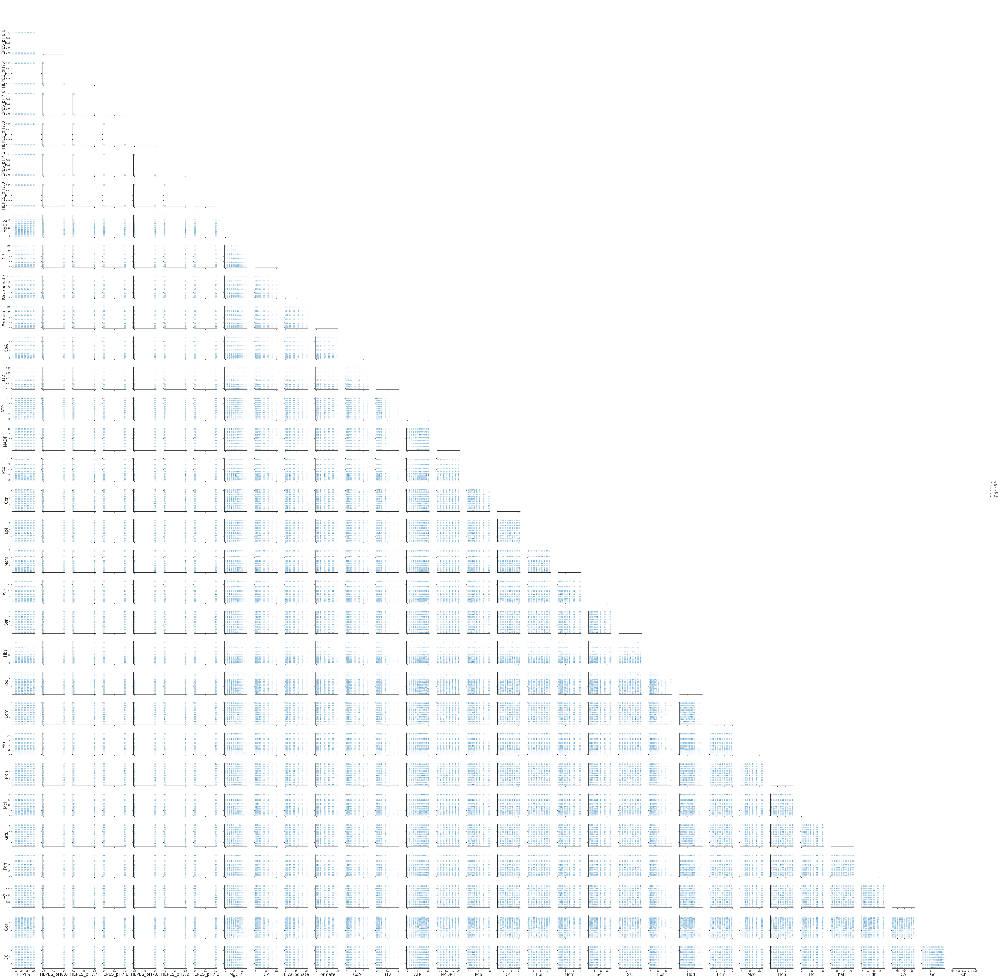

In [ ]:
plt.figure(figsize=(60, 60))
sns.set_context(rc={"axes.labelsize":24, "lines.linewidth": 20})

yield_pairplot=sns.pairplot(data=yield_all, corner=True, hue='yield', palette='Blues', plot_kws=dict(s=80, edgecolor="none", alpha=0.5))

In [ ]:
#yield_pairplot.savefig('yield_pairplot.png', format='png', dpi=1200)
yield_pairplot.savefig('yield_pairplot.svg', format='svg', dpi=1200)

**Analysis of the top 10% yileds**

In [ ]:
yield_topTenPercent=yield_all.loc[yield_all['yield'] >= yield_all['yield'].quantile(q=0.9)]

In [ ]:
yield_topTenPercent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63 entries, 138 to 607
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        63 non-null     int64  
 1   HEPES_pH8.0  63 non-null     int64  
 2   HEPES_pH7.4  63 non-null     int64  
 3   HEPES_pH7.6  63 non-null     int64  
 4   HEPES_pH7.8  63 non-null     int64  
 5   HEPES_pH7.2  63 non-null     int64  
 6   HEPES_pH7.0  63 non-null     int64  
 7   MgCl2        63 non-null     float64
 8   CP           63 non-null     float64
 9   Bicarbonate  63 non-null     float64
 10  Formate      63 non-null     float64
 11  CoA          63 non-null     float64
 12  B12          63 non-null     float64
 13  ATP          63 non-null     int64  
 14  NADPH        63 non-null     float64
 15  Pco          63 non-null     float64
 16  Ccr          63 non-null     float64
 17  Epi          63 non-null     float64
 18  Mcm          63 non-null     float64
 19  Scr    

In [ ]:
yield_topTenPercent=yield_topTenPercent.drop('yield', axis=1)
yield_topTenPercent.head()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
138,200,0,0,0,1,0,0,0.0,2.5,20.0,40.0,0.5,0.1,1,10.00,3.061600,2.77515,4.4670,0.304150,6.974600,4.968,6.941025,2.1816,1.72950,62.96710,1.9852,14.726,0.82065,23.296,0.083375,3.590275,3.52935
375,175,0,0,0,0,1,0,2.5,0.0,20.0,20.0,0.5,0.1,8,7.50,0.478375,1.85010,2.2335,0.912450,5.230950,2.208,21.890925,1.0908,2.01775,84.86870,1.4180,4.776,6.56520,13.104,0.066700,4.694975,1.56860
377,125,0,0,0,0,1,0,7.5,5.0,5.0,5.0,0.0,0.0,8,7.50,0.956750,2.46680,2.9780,1.520750,17.436500,3.864,12.280275,2.9088,2.01775,113.61455,1.7016,11.144,5.74455,23.296,0.033350,0.828525,2.74505
378,125,0,0,0,1,0,0,7.5,0.0,40.0,5.0,0.3,0.1,9,3.75,0.956750,1.54175,1.4890,0.456225,9.590075,0.552,1.601775,2.1816,2.01775,113.61455,2.8360,8.358,8.20650,40.768,0.133400,4.418800,3.13720
380,175,0,0,0,0,1,0,7.5,10.0,10.0,60.0,0.1,0.0,8,5.00,0.956750,2.77515,0.7445,0.912450,2.615475,1.656,1.601775,1.4544,2.59425,84.86870,0.8508,19.900,7.38585,53.872,0.166750,2.485575,0.78430


In [ ]:
control_pos= {'HEPES':100.0, 'HEPES_pH7.0':1, 'HEPES_pH7.2':1, 'HEPES_pH7.4':1, 'HEPES_pH7.6':1, 'HEPES_pH7.8':1, 'HEPES_pH8.0':1, 'MgCl2':5.0, 'CP':20.0, 'Bicarbonate':50.0, 'Formate':20.0, 'Hbs':5.33925, 'Hbd':0.7272, 'Ecm':0.5765,'Mco':21.9016, 'Mch':0.2836, 'Mcl':2.786,
       'CoA':0.5, 'B12':0.1, 'NADPH':5.0, 'ATP':2.0, 'Pco':3.0616, 'Ccr':0.6167, 'Epi':0.7445, 'Mcm':0.30415, 'Scr':2.615475, 'Ssr':0.552, 'KatE':1.6413, 'Fdh':14.56,
           'CA':0.016675, 'Gor':1.1047, 'CK':0.39215}

yield_topTenPercent = yield_topTenPercent.append(control_pos, ignore_index=True)
yield_topTenPercent.info()
yield_topTenPercent.tail()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64 entries, 0 to 63
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        64 non-null     float64
 1   HEPES_pH8.0  64 non-null     float64
 2   HEPES_pH7.4  64 non-null     float64
 3   HEPES_pH7.6  64 non-null     float64
 4   HEPES_pH7.8  64 non-null     float64
 5   HEPES_pH7.2  64 non-null     float64
 6   HEPES_pH7.0  64 non-null     float64
 7   MgCl2        64 non-null     float64
 8   CP           64 non-null     float64
 9   Bicarbonate  64 non-null     float64
 10  Formate      64 non-null     float64
 11  CoA          64 non-null     float64
 12  B12          64 non-null     float64
 13  ATP          64 non-null     float64
 14  NADPH        64 non-null     float64
 15  Pco          64 non-null     float64
 16  Ccr          64 non-null     float64
 17  Epi          64 non-null     float64
 18  Mcm          64 non-null     float64
 19  Scr       

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,100.0,0.0,0.0,1.0,0.0,0.0,0.0,7.5,0.0,2.5,20.0,1.0,0.1,8.0,5.00,5.35780,0.6167,4.4670,1.21660,3.487300,1.104,1.601775,1.4544,2.30600,113.61455,1.1344,4.776,8.20650,7.28,0.050025,1.933225,3.13720
60,75.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,5.0,20.0,10.0,0.0,0.1,8.0,2.50,4.01835,2.4668,2.9780,1.52075,6.974600,4.968,12.280275,3.6360,0.57650,26.00815,1.4180,19.900,0.82065,7.28,0.050025,4.142625,0.78430
61,100.0,0.0,0.0,0.0,0.0,1.0,0.0,7.5,20.0,10.0,5.0,0.4,0.0,8.0,5.00,3.06160,0.6167,2.2335,1.52075,6.974600,3.864,1.601775,2.9088,1.15300,84.86870,1.4180,14.726,2.46195,72.80,0.150075,5.247325,1.17645
62,75.0,0.0,0.0,0.0,1.0,0.0,0.0,15.0,0.0,10.0,20.0,0.3,0.0,8.0,6.25,4.01835,3.0835,1.4890,0.60830,13.077375,2.760,12.280275,2.9088,1.44125,84.86870,1.1344,14.726,1.64130,72.80,0.050025,2.485575,2.74505
63,100.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0,20.0,50.0,20.0,0.5,0.1,2.0,5.00,3.06160,0.6167,0.7445,0.30415,2.615475,0.552,5.339250,0.7272,0.57650,21.90160,0.2836,2.786,1.64130,14.56,0.016675,1.104700,0.39215


In [ ]:

yield_topNorm=yield_topTenPercent.loc[:,:] = yield_topTenPercent.loc[:,:].div(yield_topTenPercent.iloc[-1][:])
yield_topNorm.tail()

,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,1.00,0.0,0.0,1.0,0.0,0.0,0.0,1.5,0.00,0.05,1.00,2.0,1.0,4.0,1.00,1.7500,1.0,6.0,4.0,1.333333,2.0,0.3,2.0,4.0,5.1875,4.0,1.714286,5.0,0.5,3.0,1.75,8.0
60,0.75,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.25,0.40,0.50,0.0,1.0,4.0,0.50,1.3125,4.0,4.0,5.0,2.666667,9.0,2.3,5.0,1.0,1.1875,5.0,7.142857,0.5,0.5,3.0,3.75,2.0
61,1.00,0.0,0.0,0.0,0.0,1.0,0.0,1.5,1.00,0.20,0.25,0.8,0.0,4.0,1.00,1.0000,1.0,3.0,5.0,2.666667,7.0,0.3,4.0,2.0,3.8750,5.0,5.285714,1.5,5.0,9.0,4.75,3.0
62,0.75,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.00,0.20,1.00,0.6,0.0,4.0,1.25,1.3125,5.0,2.0,2.0,5.000000,5.0,2.3,4.0,2.5,3.8750,4.0,5.285714,1.0,5.0,3.0,2.25,7.0
63,1.00,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00,1.00,1.00,1.0,1.0,1.0,1.00,1.0000,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0000,1.0,1.000000,1.0,1.0,1.0,1.00,1.0


In [ ]:
yield_topNormLog=np.log10(yield_topNorm)
yield_topNormLog.tail()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


,HEPES,HEPES_pH8.0,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH7.2,HEPES_pH7.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
59,0.000000,-inf,-inf,0.0,-inf,-inf,-inf,0.176091,-inf,-1.30103,0.00000,0.301030,0.0,0.60206,0.00000,0.243038,0.00000,0.778151,0.60206,0.124939,0.301030,-0.522879,0.30103,0.60206,0.714958,0.60206,0.234083,0.698970,-0.30103,0.477121,0.243038,0.903090
60,-0.124939,-inf,-inf,-inf,-inf,0.0,-inf,0.000000,-0.60206,-0.39794,-0.30103,-inf,0.0,0.60206,-0.30103,0.118099,0.60206,0.602060,0.69897,0.425969,0.954243,0.361728,0.69897,0.00000,0.074634,0.69897,0.853872,-0.301030,-0.30103,0.477121,0.574031,0.301030
61,0.000000,-inf,-inf,-inf,-inf,0.0,-inf,0.176091,0.00000,-0.69897,-0.60206,-0.096910,-inf,0.60206,0.00000,0.000000,0.00000,0.477121,0.69897,0.425969,0.845098,-0.522879,0.60206,0.30103,0.588272,0.69897,0.723104,0.176091,0.69897,0.954243,0.676694,0.477121
62,-0.124939,-inf,-inf,-inf,0.0,-inf,-inf,0.477121,-inf,-0.69897,0.00000,-0.221849,-inf,0.60206,0.09691,0.118099,0.69897,0.301030,0.30103,0.698970,0.698970,0.361728,0.60206,0.39794,0.588272,0.60206,0.723104,0.000000,0.69897,0.477121,0.352183,0.845098
63,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000


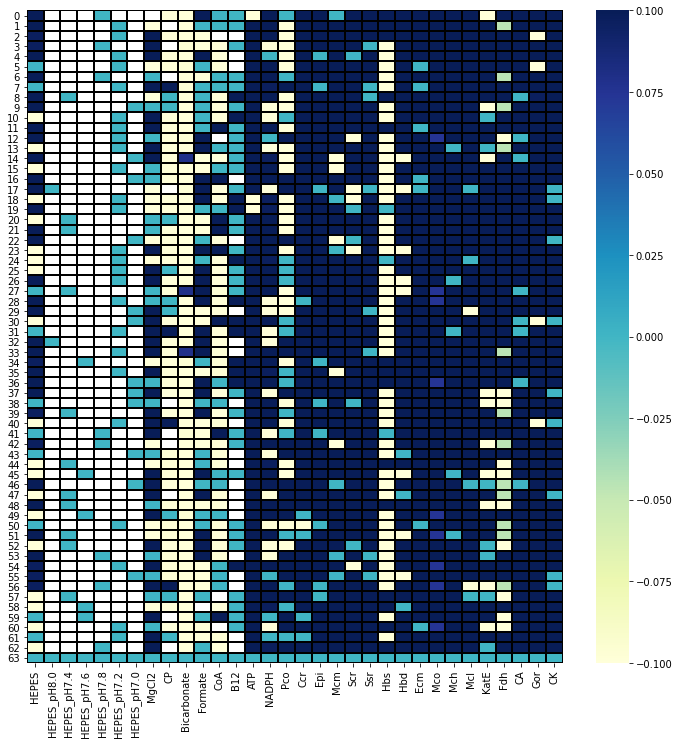

In [ ]:
plt.figure(figsize=(12, 12))
yield_topten_heatmap=sns.heatmap(data=yield_topNormLog, cmap="YlGnBu", linewidths=1, linecolor='black', )

In [ ]:
figure = yield_topten_heatmap.get_figure()  
#figure.savefig('yield_topten_heatmap.png', format='png', dpi=1200)
figure.savefig('yield_topten_heatmap.svg', format='svg', dpi=1200)

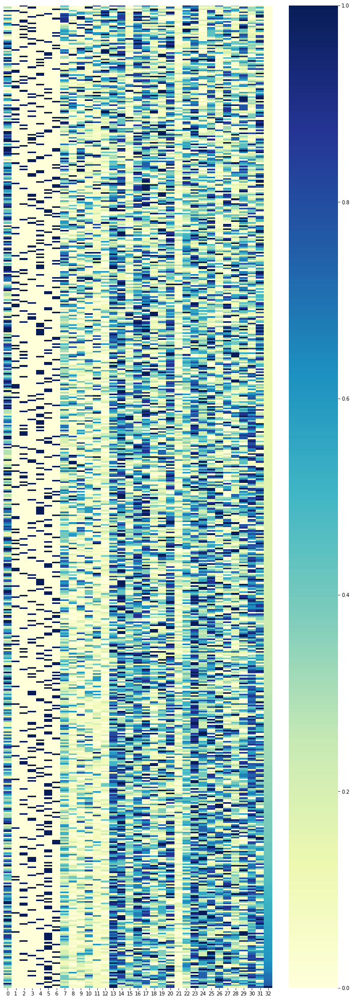

In [ ]:
from sklearn import preprocessing

scaler=preprocessing.MinMaxScaler()
scaled_yields=scaler.fit_transform(yield_all.sort_values(by='yield'))

plt.figure(figsize=(12, 36))
yield_all_heatmap=sns.heatmap(data=scaled_yields, cmap="YlGnBu", xticklabels=True, yticklabels=False)

In [ ]:
figure = yield_all_heatmap.get_figure()  
#figure.savefig('yield_all_heatmap.png', format='png', dpi=1200)
figure.savefig('yield_all_heatmap.svg', format='svg', dpi=1200)

**Efficiency data analysis**

In [ ]:
efficiency_all = pd.read_csv('Efficiency_all_data.csv')
efficiency_all.head()

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,yield,yield_std
0,50,0,0,0,0,0,1,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.8180,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725,3.252306,0.807854321
1,175,1,0,0,0,0,0,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.2716,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725,2.016035,0.214873898
2,25,0,1,0,0,0,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.9064,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725,1.147640,0.117307029
3,25,0,0,0,0,0,1,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.1812,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647,0.938019,0.34250859
4,50,0,0,1,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.6360,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431,0.470937,0.070028367


In [ ]:
efficiency_all=efficiency_all.drop('yield_std', axis=1)
efficiency_all.head()

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK,yield
0,50,0,0,0,0,0,1,20.0,60.0,2.5,2.5,0.00,0.1,7,7.50,2.296200,0.61670,6.7005,0.456225,9.590075,0.552,1.8180,2.135700,2.88250,19.16390,1.9852,8.358,8.20650,7.280,0.066700,2.209400,3.13725,3.252306
1,175,1,0,0,0,0,0,15.0,60.0,60.0,0.0,0.25,0.2,7,1.25,0.287025,1.85010,2.9780,0.912450,2.615475,1.656,11.2716,4.805325,0.57650,34.22125,2.2688,1.990,7.38585,13.104,0.166750,2.485575,3.13725,2.016035
2,25,0,1,0,0,0,0,5.0,60.0,20.0,40.0,0.50,0.2,10,5.00,3.061600,0.30835,2.2335,1.216600,5.230950,4.968,26.9064,3.737475,1.44125,9.58195,0.8508,14.726,2.46195,1.456,0.050025,0.552350,3.13725,1.147640
3,25,0,0,0,0,0,1,5.0,80.0,80.0,5.0,0.50,0.4,7,5.00,1.243775,0.61670,5.2115,1.520750,0.871825,2.760,6.1812,3.737475,2.01775,6.84425,1.1344,19.900,5.74455,13.104,0.033350,1.380875,1.17647,0.938019
4,50,0,0,1,0,0,0,7.5,5.0,2.5,2.5,3.00,0.1,9,1.25,5.357800,2.46680,2.2335,0.912450,13.077375,4.968,3.6360,1.067850,0.86475,5.47540,0.5672,6.368,5.74455,5.824,0.166750,2.485575,0.78431,0.470937


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping

<Figure size 4320x4320 with 0 Axes>

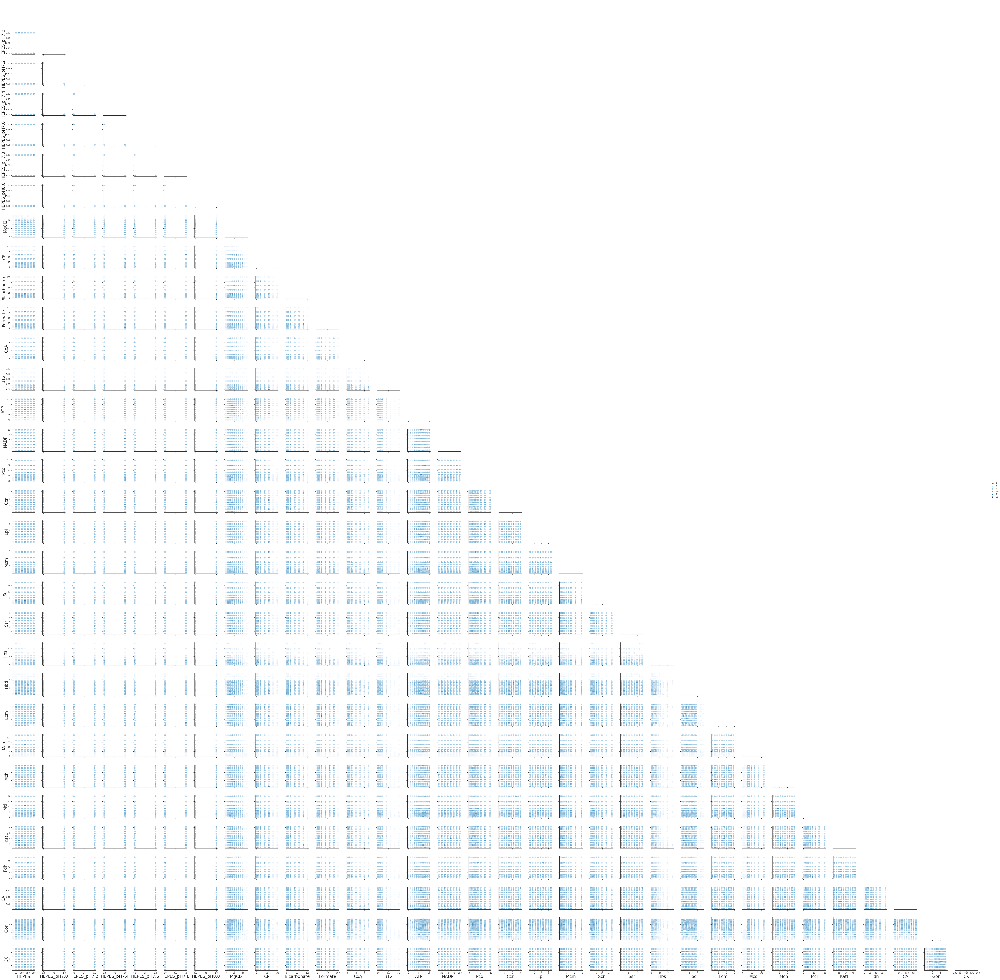

In [ ]:
plt.figure(figsize=(60, 60))
sns.set_context(rc={"axes.labelsize":24, "lines.linewidth": 20})

efficiency_pairplot=sns.pairplot(data=efficiency_all, corner=True, hue='yield', palette='Blues', plot_kws=dict(s=80, edgecolor="none", alpha=0.5))

In [ ]:
#efficiency_pairplot.savefig('efficiency_pairplot.png', format='png', dpi=1200)
efficiency_pairplot.savefig('efficiency_pairplot.svg', format='svg', dpi=1200)

**Analysis of the top 10% yileds**

In [ ]:
efficiency_topTenPercent=efficiency_all.loc[efficiency_all['yield'] >= efficiency_all['yield'].quantile(q=0.9)]

In [ ]:
efficiency_topTenPercent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 386 to 983
Data columns (total 33 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        100 non-null    int64  
 1   HEPES_pH7.0  100 non-null    int64  
 2   HEPES_pH7.2  100 non-null    int64  
 3   HEPES_pH7.4  100 non-null    int64  
 4   HEPES_pH7.6  100 non-null    int64  
 5   HEPES_pH7.8  100 non-null    int64  
 6   HEPES_pH8.0  100 non-null    int64  
 7   MgCl2        100 non-null    float64
 8   CP           100 non-null    float64
 9   Bicarbonate  100 non-null    float64
 10  Formate      100 non-null    float64
 11  CoA          100 non-null    float64
 12  B12          100 non-null    float64
 13  ATP          100 non-null    int64  
 14  NADPH        100 non-null    float64
 15  Pco          100 non-null    float64
 16  Ccr          100 non-null    float64
 17  Epi          100 non-null    float64
 18  Mcm          100 non-null    float64
 19  Scr   

In [ ]:
efficiency_topTenPercent=efficiency_topTenPercent.drop('yield', axis=1)
efficiency_topTenPercent.head()

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
386,100,0,0,0,0,1,0,10.0,40.0,40.0,20.0,0.5,0.1,10,6.25,5.35780,1.54175,0.7445,2.889425,13.077375,0.552,1.601775,1.4544,0.57650,46.54090,0.8508,19.900,5.74455,23.296,0.033350,2.485575,1.96075
400,150,0,0,0,0,1,0,5.0,10.0,40.0,40.0,0.0,0.1,6,5.00,4.01835,3.08350,5.2115,0.608300,1.743650,1.104,1.601775,1.8180,2.01775,26.00815,0.5672,4.776,6.56520,7.280,0.016675,3.590275,1.17645
403,75,0,0,0,0,1,0,12.5,5.0,10.0,40.0,0.5,0.1,10,3.75,2.29620,2.15845,1.4890,1.520750,6.974600,4.416,0.533925,1.4544,2.88250,46.54090,0.2836,14.726,1.64130,13.104,0.033350,4.418800,2.74505
453,150,0,0,0,0,1,0,5.0,20.0,2.5,40.0,0.2,0.2,7,3.75,0.95675,0.61670,1.4890,0.912450,5.230950,3.864,1.601775,1.8180,0.86475,26.00815,2.5524,14.726,7.38585,30.576,0.133400,2.485575,2.35290
474,200,0,0,0,0,1,0,15.0,10.0,60.0,80.0,0.4,0.0,10,10.00,4.01835,2.77515,5.9560,1.520750,9.590075,0.552,0.533925,3.6360,1.72950,34.22125,2.2688,4.776,4.92390,13.104,0.083375,1.933225,2.35290


In [ ]:
control_pos= {'HEPES':100.0, 'HEPES_pH7.0':1, 'HEPES_pH7.2':1, 'HEPES_pH7.4':1, 'HEPES_pH7.6':1, 'HEPES_pH7.8':1, 'HEPES_pH8.0':1, 'MgCl2':5.0, 'CP':20.0, 'Bicarbonate':50.0, 'Formate':20.0, 'Hbs':5.33925, 'Hbd':0.7272, 'Ecm':0.5765,'Mco':21.9016, 'Mch':0.2836, 'Mcl':2.786,
       'CoA':0.5, 'B12':0.1, 'NADPH':5.0, 'ATP':2.0, 'Pco':3.0616, 'Ccr':0.6167, 'Epi':0.7445, 'Mcm':0.30415, 'Scr':2.615475, 'Ssr':0.552, 'KatE':1.6413, 'Fdh':14.56,
           'CA':0.016675, 'Gor':1.1047, 'CK':0.39215}

efficiency_topTenPercent = efficiency_topTenPercent.append(control_pos, ignore_index=True)
efficiency_topTenPercent.info()
efficiency_topTenPercent.tail()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101 entries, 0 to 100
Data columns (total 32 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HEPES        101 non-null    float64
 1   HEPES_pH7.0  101 non-null    float64
 2   HEPES_pH7.2  101 non-null    float64
 3   HEPES_pH7.4  101 non-null    float64
 4   HEPES_pH7.6  101 non-null    float64
 5   HEPES_pH7.8  101 non-null    float64
 6   HEPES_pH8.0  101 non-null    float64
 7   MgCl2        101 non-null    float64
 8   CP           101 non-null    float64
 9   Bicarbonate  101 non-null    float64
 10  Formate      101 non-null    float64
 11  CoA          101 non-null    float64
 12  B12          101 non-null    float64
 13  ATP          101 non-null    float64
 14  NADPH        101 non-null    float64
 15  Pco          101 non-null    float64
 16  Ccr          101 non-null    float64
 17  Epi          101 non-null    float64
 18  Mcm          101 non-null    float64
 19  Scr     

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
96,200.0,0.0,0.0,0.0,0.0,1.0,0.0,5.0,5.0,20.0,60.0,0.4,0.0,8.0,3.75,0.95675,1.23340,1.4890,1.520750,2.615475,1.104,9.076725,0.3636,0.57650,34.22125,1.9852,6.368,0.82065,7.280,0.133400,5.247325,3.13720
97,200.0,0.0,0.0,1.0,0.0,0.0,0.0,12.5,20.0,20.0,20.0,4.0,0.0,3.0,2.50,3.06160,2.15845,4.4670,0.152075,2.615475,0.552,0.533925,2.5452,2.30600,26.00815,0.8508,4.776,2.46195,23.296,0.033350,3.590275,1.96075
98,50.0,0.0,0.0,1.0,0.0,0.0,0.0,15.0,2.5,2.5,20.0,1.0,0.0,2.0,3.75,1.72215,1.23340,3.7225,1.216600,2.615475,2.760,1.601775,1.0908,0.28825,34.22125,0.8508,6.368,5.74455,7.280,0.033350,4.418800,1.56860
99,50.0,0.0,0.0,0.0,1.0,0.0,0.0,10.0,20.0,20.0,80.0,0.0,0.0,2.0,2.50,3.06160,0.61670,3.7225,0.608300,2.615475,0.552,1.601775,3.2724,2.59425,26.00815,2.8360,8.358,4.92390,13.104,0.133400,4.694975,1.17645
100,100.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0,20.0,50.0,20.0,0.5,0.1,2.0,5.00,3.06160,0.61670,0.7445,0.304150,2.615475,0.552,5.339250,0.7272,0.57650,21.90160,0.2836,2.786,1.64130,14.560,0.016675,1.104700,0.39215


In [ ]:

efficiency_topNorm=efficiency_topTenPercent.loc[:,:] = efficiency_topTenPercent.loc[:,:].div(efficiency_topTenPercent.iloc[-1][:])
efficiency_topNorm.tail()

,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
96,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.250,0.40,3.0,0.8,0.0,4.0,0.75,0.3125,2.0,2.0,5.0,1.0,2.0,1.7,0.5,1.0,1.5625,7.0,2.285714,0.5,0.5,8.0,4.75,8.0
97,2.0,0.0,0.0,1.0,0.0,0.0,0.0,2.5,1.000,0.40,1.0,8.0,0.0,1.5,0.50,1.0000,3.5,6.0,0.5,1.0,1.0,0.1,3.5,4.0,1.1875,3.0,1.714286,1.5,1.6,2.0,3.25,5.0
98,0.5,0.0,0.0,1.0,0.0,0.0,0.0,3.0,0.125,0.05,1.0,2.0,0.0,1.0,0.75,0.5625,2.0,5.0,4.0,1.0,5.0,0.3,1.5,0.5,1.5625,3.0,2.285714,3.5,0.5,2.0,4.00,4.0
99,0.5,0.0,0.0,0.0,1.0,0.0,0.0,2.0,1.000,0.40,4.0,0.0,0.0,1.0,0.50,1.0000,1.0,5.0,2.0,1.0,1.0,0.3,4.5,4.5,1.1875,10.0,3.000000,3.0,0.9,8.0,4.25,3.0
100,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000,1.00,1.0,1.0,1.0,1.0,1.00,1.0000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0000,1.0,1.000000,1.0,1.0,1.0,1.00,1.0


In [ ]:
efficiency_topNormLog=np.log10(efficiency_topNorm)
efficiency_topNormLog.tail()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


,HEPES,HEPES_pH7.0,HEPES_pH7.2,HEPES_pH7.4,HEPES_pH7.6,HEPES_pH7.8,HEPES_pH8.0,MgCl2,CP,Bicarbonate,Formate,CoA,B12,ATP,NADPH,Pco,Ccr,Epi,Mcm,Scr,Ssr,Hbs,Hbd,Ecm,Mco,Mch,Mcl,KatE,Fdh,CA,Gor,CK
96,0.30103,-inf,-inf,-inf,-inf,0.0,-inf,0.000000,-0.60206,-0.39794,0.477121,-0.09691,-inf,0.602060,-0.124939,-0.505150,0.301030,0.301030,0.69897,0.0,0.30103,0.230449,-0.301030,0.000000,0.193820,0.845098,0.359022,-0.301030,-0.301030,0.90309,0.676694,0.903090
97,0.30103,-inf,-inf,0.0,-inf,-inf,-inf,0.397940,0.00000,-0.39794,0.000000,0.90309,-inf,0.176091,-0.301030,0.000000,0.544068,0.778151,-0.30103,0.0,0.00000,-1.000000,0.544068,0.602060,0.074634,0.477121,0.234083,0.176091,0.204120,0.30103,0.511883,0.698970
98,-0.30103,-inf,-inf,0.0,-inf,-inf,-inf,0.477121,-0.90309,-1.30103,0.000000,0.30103,-inf,0.000000,-0.124939,-0.249877,0.301030,0.698970,0.60206,0.0,0.69897,-0.522879,0.176091,-0.301030,0.193820,0.477121,0.359022,0.544068,-0.301030,0.30103,0.602060,0.602060
99,-0.30103,-inf,-inf,-inf,0.0,-inf,-inf,0.301030,0.00000,-0.39794,0.602060,-inf,-inf,0.000000,-0.301030,0.000000,0.000000,0.698970,0.30103,0.0,0.00000,-0.522879,0.653213,0.653213,0.074634,1.000000,0.477121,0.477121,-0.045757,0.90309,0.628389,0.477121
100,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,0.00000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000


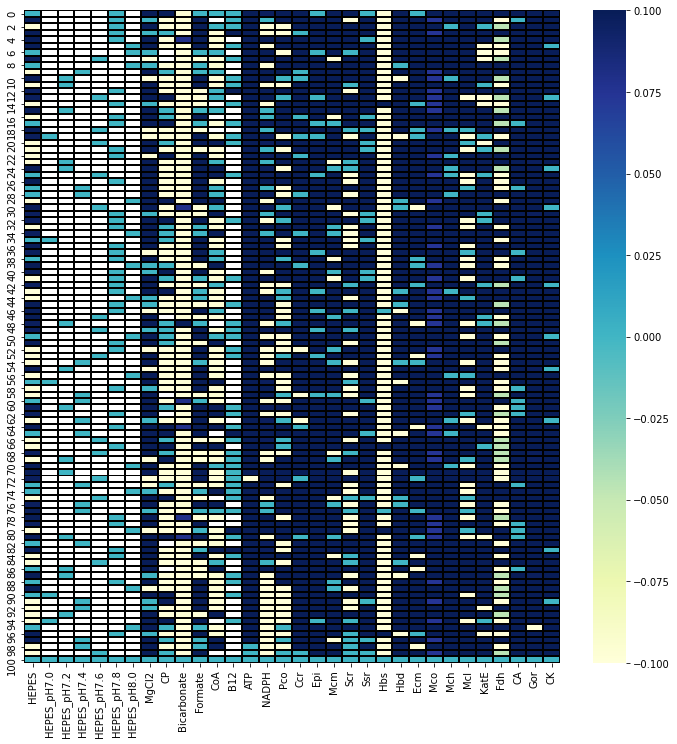

In [ ]:
plt.figure(figsize=(12, 12))
efficiency_topten_heatmap=sns.heatmap(data=efficiency_topNormLog, cmap="YlGnBu", linewidths=1, linecolor='black', )

In [ ]:
figure = efficiency_topten_heatmap.get_figure()  
#figure.savefig('efficiency_topten_heatmap.png', format='png', dpi=1200)
figure.savefig('efficiency_topten_heatmap.svg', format='svg', dpi=1200)

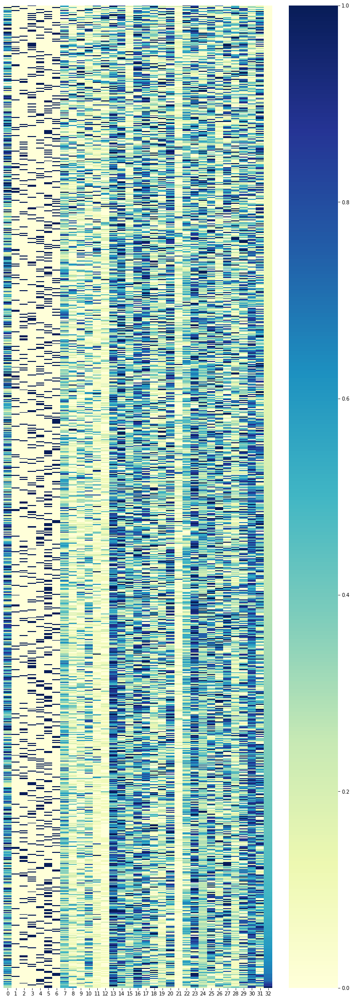

In [ ]:
from sklearn import preprocessing

scaler=preprocessing.MinMaxScaler()
scaled_efficiency=scaler.fit_transform(efficiency_all.sort_values(by='yield'))

plt.figure(figsize=(12, 36))
efficiency_all_heatmap=sns.heatmap(data=scaled_efficiency, cmap="YlGnBu", xticklabels=True, yticklabels=False)

In [ ]:
figure = efficiency_all_heatmap.get_figure()  
#figure.savefig('efficiency_all_heatmap.png', format='png', dpi=1200)
figure.savefig('efficiency_all_heatmap.svg', format='svg', dpi=1200)